Here is a simpler example of the use of LIME for image classification by using Keras (v2 or greater)

In [1]:
import os
import keras
from keras.applications import inception_v3 as inc_net
from keras.preprocessing import image
from keras.applications.imagenet_utils import decode_predictions
from skimage.io import imread
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

print('Notebook run using keras:', keras.__version__)

Using TensorFlow backend.


Notebook run using keras: 2.2.0


# Using Inception
Here we create a standard InceptionV3 pretrained model and use it on images by first preprocessing them with the preprocessing tools

In [2]:
inet_model = inc_net.InceptionV3()

96116736/96112376 [==============================] - 48s 0us/step


In [3]:
def transform_img_fn(path_list):
    out = []
    for img_path in path_list:
        img = image.load_img(img_path, target_size=(299, 299))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = inc_net.preprocess_input(x)
        out.append(x)
    return np.vstack(out)

## Let's see the top 5 prediction for some image

40960/35363 [==================================] - 0s 3us/step
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)


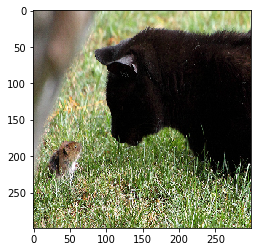

In [4]:
images = transform_img_fn([os.path.join('data','cat_mouse.jpg')])
# I'm dividing by 2 and adding 0.5 because of how this Inception represents images
plt.imshow(images[0] / 2 + 0.5)
preds = inet_model.predict(images)
for x in decode_predictions(preds)[0]:
    print(x)

(class, description, probability)

## Explanation
Now let's get an explanation

In [5]:
%load_ext autoreload
%autoreload 2
import os,sys
try:
    import lime
except:
    sys.path.append(os.path.join('..', '..')) # add the current directory
    import lime
from lime import lime_image

In [6]:
explainer = lime_image.LimeImageExplainer()

hide_color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels. Here, we set it to 0 (in the representation used by inception model, 0 means gray)

In [7]:
%%time
# Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
explanation = explainer.explain_instance(images[0], inet_model.predict, top_labels=5, hide_color=0, num_samples=1000)

CPU times: user 12.7 s, sys: 3.28 s, total: 16 s
Wall time: 11.8 s


Follows same steps as LimeTextExp -- i.e. get neighborhood, train model to be like og model  
Perturb - on/off superpixels  

Image classifiers are a bit slow. Notice that an explanation on my Surface Book dGPU took 1min 29s

### Now let's see the explanation for the top class ( Black Bear)

We can see the top 5 superpixels that are most positive towards the class with the rest of the image hidden

In [8]:
from skimage.segmentation import mark_boundaries

Image Segmentation - process of assigning a label to every pixel in an image such that pixels with the same label share certain characteristics

[295, 224, 223, 106, 104]


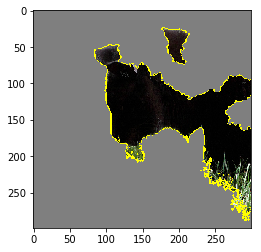

In [9]:
temp, mask = explanation.get_image_and_mask(295, positive_only=True, num_features=5, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

print(explanation.top_labels)

Or with the rest of the image present:

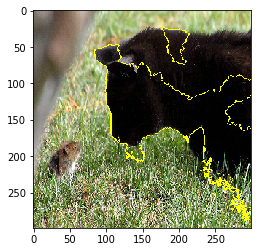

In [10]:
temp, mask = explanation.get_image_and_mask(295, positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))


We can also see the 'pros and cons' (pros in green, cons in red)

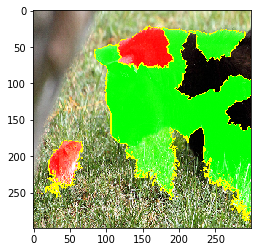

In [11]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

Or the pros and cons that have weight at least 0.1

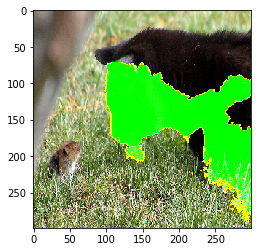

In [12]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Testing Section!!

jupyter nbconvert --to script [YOUR_NOTEBOOK].ipynb  (<-- to convert to python script)

In [31]:
import types
from lime.utils.generic_utils import has_arg
from skimage.segmentation import felzenszwalb, slic, quickshift

class BaseWrapper(object):
    """Base class for LIME Scikit-Image wrapper


    Args:
        target_fn: callable function or class instance
        target_params: dict, parameters to pass to the target_fn


    'target_params' takes parameters required to instanciate the
        desired Scikit-Image class/model
    """

    def __init__(self, target_fn=None, **target_params):
        self.target_fn = target_fn
        self.target_params = target_params

        self.target_fn = target_fn
        self.target_params = target_params

    def _check_params(self, parameters):
        """Checks for mistakes in 'parameters'

        Args :
            parameters: dict, parameters to be checked

        Raises :
            ValueError: if any parameter is not a valid argument for the target function
                or the target function is not defined
            TypeError: if argument parameters is not iterable
         """
        a_valid_fn = []
        if self.target_fn is None:
            if callable(self):
                a_valid_fn.append(self.__call__)
            else:
                raise TypeError('invalid argument: tested object is not callable,\
                 please provide a valid target_fn')
        elif isinstance(self.target_fn, types.FunctionType) \
                or isinstance(self.target_fn, types.MethodType):
            a_valid_fn.append(self.target_fn)
        else:
            a_valid_fn.append(self.target_fn.__call__)

        if not isinstance(parameters, str):
            for p in parameters:
                for fn in a_valid_fn:
                    if has_arg(fn, p):
                        pass
                    else:
                        raise ValueError('{} is not a valid parameter'.format(p))
        else:
            raise TypeError('invalid argument: list or dictionnary expected')

    def set_params(self, **params):
        """Sets the parameters of this estimator.
        Args:
            **params: Dictionary of parameter names mapped to their values.

        Raises :
            ValueError: if any parameter is not a valid argument
                for the target function
        """
        self._check_params(params)
        self.target_params = params

    def filter_params(self, fn, override=None):
        """Filters `target_params` and return those in `fn`'s arguments.
        Args:
            fn : arbitrary function
            override: dict, values to override target_params
        Returns:
            result : dict, dictionary containing variables
            in both target_params and fn's arguments.
        """
        override = override or {}
        result = {}
        for name, value in self.target_params.items():
            if has_arg(fn, name):
                result.update({name: value})
        result.update(override)
        return result


class SegmentationAlgorithm(BaseWrapper):
    """ Define the image segmentation function based on Scikit-Image
            implementation and a set of provided parameters

        Args:
            algo_type: string, segmentation algorithm among the following:
                'quickshift', 'slic', 'felzenszwalb'
            target_params: dict, algorithm parameters (valid model paramters
                as define in Scikit-Image documentation)
    """

    def __init__(self, algo_type, **target_params):
        self.algo_type = algo_type
        if (self.algo_type == 'quickshift'):
            BaseWrapper.__init__(self, quickshift, **target_params)
            kwargs = self.filter_params(quickshift)
            self.set_params(**kwargs)
        elif (self.algo_type == 'felzenszwalb'):
            BaseWrapper.__init__(self, felzenszwalb, **target_params)
            kwargs = self.filter_params(felzenszwalb)
            self.set_params(**kwargs)
        elif (self.algo_type == 'slic'):
            BaseWrapper.__init__(self, slic, **target_params)
            kwargs = self.filter_params(slic)
            self.set_params(**kwargs)

    def __call__(self, *args):
            return self.target_fn(args[0], **self.target_params)


def plot_figures(figures, nrows = 1, ncols=1):
    """Plot a dictionary of figures.

    Parameters
    ----------
    figures : <title, figure> dictionary
    ncols : number of columns of subplots wanted in the display
    nrows : number of rows of subplots wanted in the figure
    """

    fig, axeslist = plt.subplots(ncols=ncols, nrows=nrows, figsize=(15, 15))
    for ind,title in enumerate(figures):
        axeslist.ravel()[ind].imshow(figures[title], cmap=plt.gray())
        axeslist.ravel()[ind].set_title(title)
        axeslist.ravel()[ind].set_axis_off()
    plt.tight_layout()

In [16]:
import time


1.0
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



[295, 224, 223, 106, 104]

1.1
('n02133161', 'American_black_bear', 0.6563626)
('n02105056', 'groenendael', 0.030415628)
('n02104365', 'schipperke', 0.028470049)
('n01883070', 'wombat', 0.02737357)
('n01877812', 'wallaby', 0.023224978)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.140979e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]

1.2000000000000002
('n02133161', 'American_black_bear', 0.6681731)
('n02105056', 'groenendael', 0.028858593)
('n02104365', 'schipperke', 0.025891531)
('n01883070', 'wombat', 0.025715923)
('n01877812', 'wallaby', 0.023039035)

[295, 224, 223, 106, 104]

1.3000000000000003
('n02133161', 'American_black_bear', 0.6915362)
('n02105056', 'groenendael', 0.026463253)
('n01883070', 'wombat', 0.024863578)
('n02104365', 'schipperke', 0.022258954)
('n01877812', 'wallaby', 0.021091567)

[295, 224, 106, 223, 104]

1.4000000000000004
('n02133161', 'American_black_bear', 0.7099705)
('n01883070', 'wombat', 0.024989469)
('n02105056', 'groenendael', 0.023069488)
('n01877812', 'wallaby', 0.020161297)
('n02104365', 'schipperke', 0.018233627)

[295, 224, 106, 104, 223]

1.5000000000000004
('n02133161', 'American_black_bear', 0.7203595)
('n01883070', 'wombat', 0.024405602)
('n02105056', 'groenendael', 0.022764808)
('n01877812', 'wallaby', 0.018606799)
('n02104365', 'schipperke', 0

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.354535e-17
  overwrite_a=False)



[295, 224, 347, 256, 223]


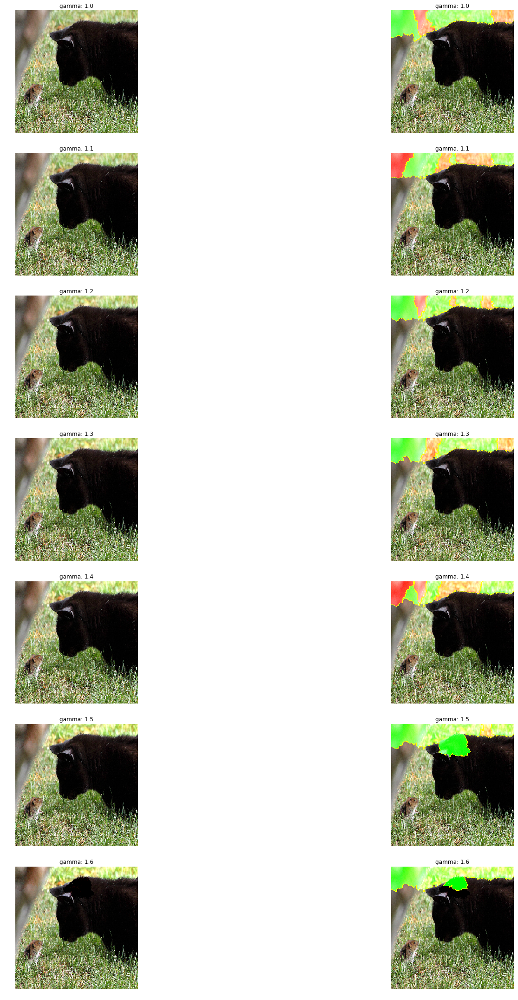

Cell ran for 14.260802507400513 seconds!


In [54]:
# # Loop for cell below:
# # Testing: Decreasing / increasing influence of superpixel
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)
gamma = 1.0
prediction = 'American_black_bear'

cols, rows = 2, 7
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(30, 30))
i = 0

start = time.time()
while gamma < 2 and prediction == 'American_black_bear' and i < cols * rows:
    print("\n" + str(gamma))
    index = np.where(mask != 0)
    alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
    alter_image[index] = alter_image[index] * gamma
    preds = inet_model.predict(np.array([alter_image]))
    tup = decode_predictions(preds)[0][0]
    prediction = tup[1]
    for x in decode_predictions(preds)[0]:
        print(x)
    
    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex = lime_image.LimeImageExplainer()
    expl = ex.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl.top_labels))
    temp, mask = expl.get_image_and_mask(expl.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    alt_marked = mark_boundaries(temp / 2 + 0.5, mask)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    gamma += .1

plt.tight_layout()
plt.show()

end = time.time()
print("Cell ran for " + str(end - start) + " seconds!")

Contributing features in original:


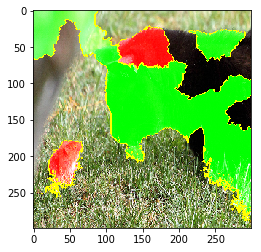

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")


1.0
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



[295, 224, 223, 106, 104]

0.9
('n02133161', 'American_black_bear', 0.6332584)
('n02105056', 'groenendael', 0.03067715)
('n01883070', 'wombat', 0.030578962)
('n02104365', 'schipperke', 0.028928591)
('n01877812', 'wallaby', 0.025850162)

[295, 224, 106, 223, 104]

0.8
('n02133161', 'American_black_bear', 0.67886883)
('n02104365', 'schipperke', 0.051317155)
('n02105056', 'groenendael', 0.033520978)
('n01883070', 'wombat', 0.021587607)
('n01877812', 'wallaby', 0.012096074)

[295, 223, 224, 106, 104]

0.7000000000000001
('n02133161', 'American_black_bear', 0.4752327)
('n02104365', 'schipperke', 0.09730565)
('n02105056', 'groenendael', 0.044548627)
('n02119789', 'kit_fox', 0.018593047)
('n01877812', 'wallaby', 0.014550546)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number6.082302e-18
  overwrite_a=False)



[295, 223, 224, 278, 104]

0.6000000000000001
('n02133161', 'American_black_bear', 0.5622704)
('n02104365', 'schipperke', 0.053058866)
('n02105056', 'groenendael', 0.04171099)
('n01883070', 'wombat', 0.019589106)
('n01877812', 'wallaby', 0.015768714)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.237362e-17
  overwrite_a=False)



[295, 223, 224, 106, 104]

0.5000000000000001
('n02133161', 'American_black_bear', 0.3555677)
('n02104365', 'schipperke', 0.058191795)
('n02105056', 'groenendael', 0.052669182)
('n01877812', 'wallaby', 0.023351591)
('n02410509', 'bison', 0.017806934)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.060788e-17
  overwrite_a=False)



[295, 223, 224, 104, 347]

0.40000000000000013
('n02133161', 'American_black_bear', 0.4128768)
('n02104365', 'schipperke', 0.03246331)
('n02105056', 'groenendael', 0.025400592)
('n01883070', 'wombat', 0.025327394)
('n01877812', 'wallaby', 0.025281422)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.710205e-17
  overwrite_a=False)



[295, 223, 224, 106, 104]

0.30000000000000016
('n02133161', 'American_black_bear', 0.33823162)
('n02104365', 'schipperke', 0.03378457)
('n02105056', 'groenendael', 0.024832075)
('n01877812', 'wallaby', 0.024244273)
('n01883070', 'wombat', 0.02412098)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number9.641304e-18
  overwrite_a=False)



[295, 223, 224, 104, 106]

0.20000000000000015
('n02133161', 'American_black_bear', 0.41655302)
('n02104365', 'schipperke', 0.09541383)
('n02445715', 'skunk', 0.034912013)
('n02105056', 'groenendael', 0.024549594)
('n02119789', 'kit_fox', 0.020156244)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.374511e-17
  overwrite_a=False)



[295, 223, 361, 224, 278]

0.10000000000000014
('n02133161', 'American_black_bear', 0.33285165)
('n02104365', 'schipperke', 0.057757787)
('n02105056', 'groenendael', 0.02727346)
('n01883070', 'wombat', 0.023345128)
('n02410509', 'bison', 0.021266049)

[295, 223, 224, 106, 347]

1.3877787807814457e-16
('n02133161', 'American_black_bear', 0.32047307)
('n02104365', 'schipperke', 0.06605975)
('n02410509', 'bison', 0.03266112)
('n02105056', 'groenendael', 0.024937315)
('n02119789', 'kit_fox', 0.019508947)

[295, 223, 347, 224, 278]


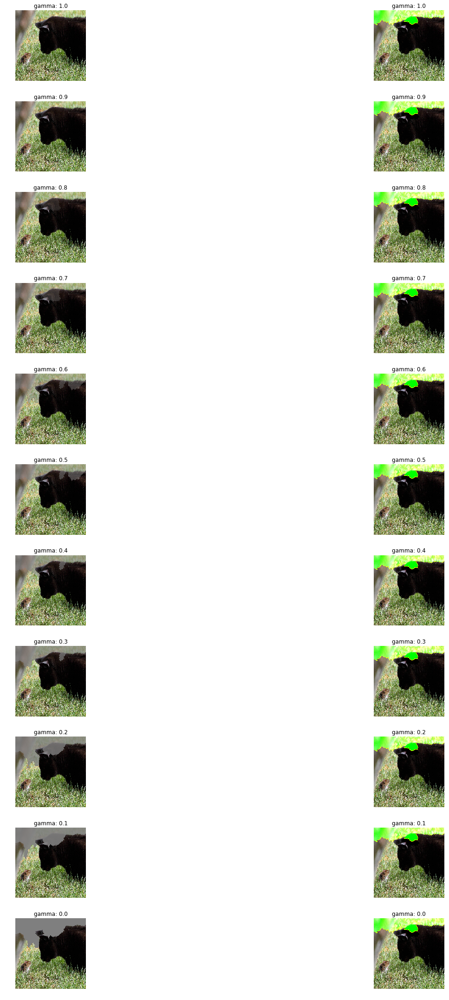

In [57]:
# Testing: Decreasing influence of superpixel
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)

gamma = 1.00
prediction = 'American_black_bear'

cols, rows = 2, 11
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(30, 30))
i = 0

while gamma > 0 and prediction == 'American_black_bear':
    print("\n" + str(gamma))
    index = np.where(mask != 0)
    alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
    alter_image[index] = alter_image[index] * gamma
    preds = inet_model.predict(np.array([alter_image]))
    tup = decode_predictions(preds)[0][0]
    prediction = tup[1]
    for x in decode_predictions(preds)[0]:
        print(x)

    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex_0 = lime_image.LimeImageExplainer()
    expl_0 = ex_0.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl_0.top_labels))
    temp, mask = expl_0.get_image_and_mask(expl_0.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    gamma -= .1

plt.tight_layout()
plt.show()

Contributing features in original:


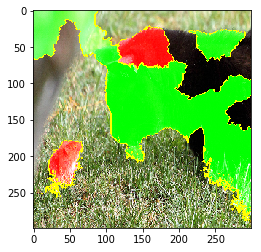

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")


1.0
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.130577e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]

0.9
('n02133161', 'American_black_bear', 0.51693434)
('n02104365', 'schipperke', 0.053966515)
('n02105056', 'groenendael', 0.041496508)
('n01883070', 'wombat', 0.037208285)
('n01877812', 'wallaby', 0.028987361)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.573504e-17
  overwrite_a=False)



[295, 223, 224, 106, 104]

0.8
('n02133161', 'American_black_bear', 0.498313)
('n02104365', 'schipperke', 0.0559805)
('n02105056', 'groenendael', 0.045894746)
('n01883070', 'wombat', 0.03177554)
('n01877812', 'wallaby', 0.031015731)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



[295, 223, 224, 106, 104]

0.7000000000000001
('n02133161', 'American_black_bear', 0.4940543)
('n02104365', 'schipperke', 0.047645364)
('n02105056', 'groenendael', 0.04034875)
('n01877812', 'wallaby', 0.037845988)
('n01883070', 'wombat', 0.028346444)

[295, 223, 224, 104, 106]

0.6000000000000001
('n02133161', 'American_black_bear', 0.38650993)
('n02104365', 'schipperke', 0.0527109)
('n01877812', 'wallaby', 0.044715475)
('n02105056', 'groenendael', 0.040552445)
('n01883070', 'wombat', 0.027058436)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.798911e-17
  overwrite_a=False)



[295, 223, 104, 224, 106]

0.5000000000000001
('n02133161', 'American_black_bear', 0.22891779)
('n01877812', 'wallaby', 0.08315142)
('n02104365', 'schipperke', 0.0690636)
('n02105056', 'groenendael', 0.044930723)
('n01883070', 'wombat', 0.019529874)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.360841e-17
  overwrite_a=False)



[295, 104, 223, 224, 106]

0.40000000000000013
('n02133161', 'American_black_bear', 0.15849285)
('n02104365', 'schipperke', 0.08003621)
('n01877812', 'wallaby', 0.062370397)
('n02105056', 'groenendael', 0.04687162)
('n02123159', 'tiger_cat', 0.018671118)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.563417e-18
  overwrite_a=False)



[295, 223, 104, 224, 282]

0.30000000000000016
('n02133161', 'American_black_bear', 0.11873522)
('n02104365', 'schipperke', 0.0986178)
('n01877812', 'wallaby', 0.050582)
('n02105056', 'groenendael', 0.04661726)
('n02123159', 'tiger_cat', 0.018902661)

[295, 223, 104, 224, 282]

0.20000000000000015
('n02104365', 'schipperke', 0.117108904)
('n02133161', 'American_black_bear', 0.10622972)
('n01877812', 'wallaby', 0.06763483)
('n02105056', 'groenendael', 0.051691)
('n01883070', 'wombat', 0.017262952)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number8.009235e-18
  overwrite_a=False)



[223, 295, 104, 224, 106]


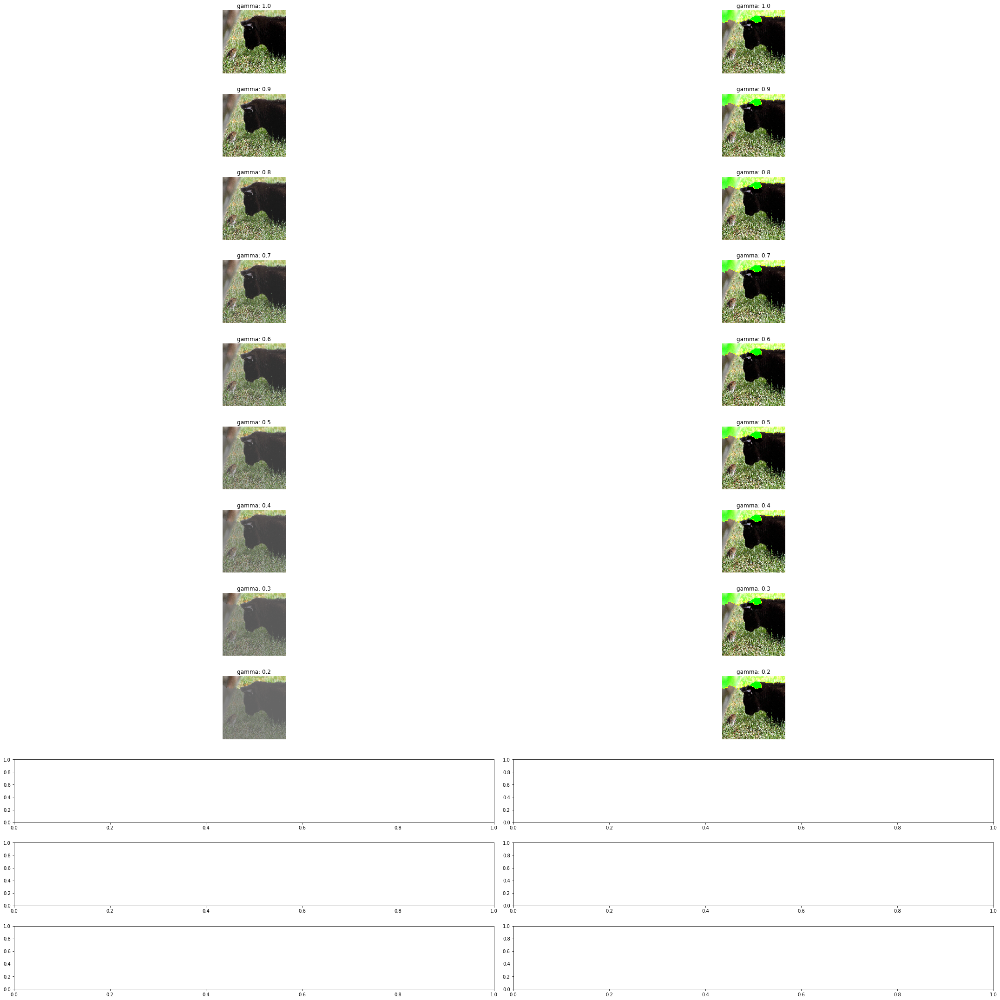

In [74]:
# Testing: Decreasing influence of all regions other than the superpixel
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)

cols, rows = 2, 12
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(30, 30))
i = 0

gamma = 1.0
prediction = 'American_black_bear'
while gamma >= 0 and prediction == 'American_black_bear':
    print("\n" + str(gamma))
    index = np.where(mask == 0)
    alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
    alter_image[index] = alter_image[index] * gamma
    preds = inet_model.predict(np.array([alter_image]))
    tup = decode_predictions(preds)[0][0]
    prediction = tup[1]
    for x in decode_predictions(preds)[0]:
        print(x)
    
    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex_1 = lime_image.LimeImageExplainer()
    expl_1 = ex_1.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl_1.top_labels))
    temp, mask = expl_1.get_image_and_mask(expl_1.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    gamma -= .1

plt.tight_layout()
plt.show()

Contributing features in original:


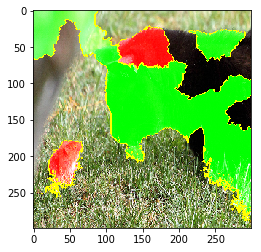

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")


1.0
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



[295, 224, 223, 106, 104]

1.1
('n02133161', 'American_black_bear', 0.48603165)
('n02104365', 'schipperke', 0.05457713)
('n02105056', 'groenendael', 0.042807736)
('n01877812', 'wallaby', 0.021557521)
('n01883070', 'wombat', 0.020480178)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.388266e-17
  overwrite_a=False)



[295, 224, 223, 104, 287]

1.2000000000000002
('n02133161', 'American_black_bear', 0.29920188)
('n02105056', 'groenendael', 0.046830818)
('n01883070', 'wombat', 0.043356594)
('n02104365', 'schipperke', 0.035806496)
('n02112137', 'chow', 0.027341964)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.379360e-19
  overwrite_a=False)



[295, 223, 224, 260, 357]

1.3000000000000003
('n02133161', 'American_black_bear', 0.10799623)
('n02112137', 'chow', 0.045934256)
('n02104365', 'schipperke', 0.03861503)
('n02105056', 'groenendael', 0.03838024)
('n02410509', 'bison', 0.034181476)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.098591e-18
  overwrite_a=False)



[295, 224, 287, 223, 357]

1.4000000000000004
('n02410509', 'bison', 0.45115614)
('n02133161', 'American_black_bear', 0.04318785)
('n02403003', 'ox', 0.031517047)
('n02104365', 'schipperke', 0.019414017)
('n02119789', 'kit_fox', 0.014630339)


/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.576799e-18
  overwrite_a=False)



[295, 278, 224, 347, 357]


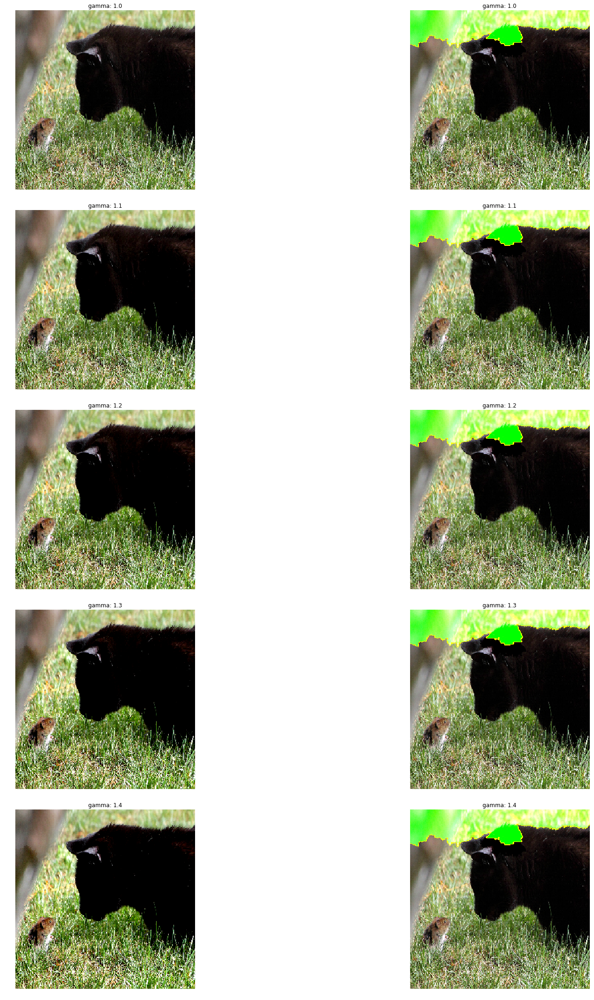

In [61]:
# Testing: Increasing influence of all regions other than the superpixel
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)

cols, rows = 2, 5
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(30, 30))
i = 0

gamma = 1.0
prediction = 'American_black_bear'
while gamma <= 2 and prediction == 'American_black_bear':
    print("\n" + str(gamma))
    index = np.where(mask == 0)
    alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
    alter_image[index] = alter_image[index] * gamma
    preds = inet_model.predict(np.array([alter_image]))
    tup = decode_predictions(preds)[0][0]
    prediction = tup[1]
    for x in decode_predictions(preds)[0]:
        print(x)
    
    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex_2 = lime_image.LimeImageExplainer()
    expl_2 = ex_2.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl_2.top_labels))
    temp, mask = expl_2.get_image_and_mask(expl_2.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    gamma += .1

plt.tight_layout()
plt.show()

Contributing features in original:


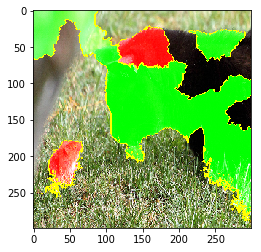

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")

Original Prediction:
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)

Testing Vertical Shifts ...

gamma = -1
('n02133161', 'American_black_bear', 0.70613724)
('n01883070', 'wombat', 0.03344505)
('n02105056', 'groenendael', 0.027132401)
('n02104365', 'schipperke', 0.018322356)
('n01877812', 'wallaby', 0.0143326735)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.807677e-17
  overwrite_a=False)



[295, 106, 224, 223, 104]
gamma = -2
('n02133161', 'American_black_bear', 0.49618077)
('n01883070', 'wombat', 0.048884775)
('n02105056', 'groenendael', 0.047439955)
('n02104365', 'schipperke', 0.04210407)
('n01877812', 'wallaby', 0.029147677)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.583607e-17
  overwrite_a=False)



[295, 106, 224, 223, 104]
gamma = -3
('n02133161', 'American_black_bear', 0.66400295)
('n02104365', 'schipperke', 0.04884229)
('n02105056', 'groenendael', 0.041026376)
('n02112137', 'chow', 0.023245828)
('n01877812', 'wallaby', 0.01270678)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



[295, 223, 224, 260, 104]
gamma = -4
('n02133161', 'American_black_bear', 0.750329)
('n02104365', 'schipperke', 0.024217611)
('n01877812', 'wallaby', 0.020931033)
('n02105056', 'groenendael', 0.018987479)
('n02112137', 'chow', 0.012957309)


[295, 223, 104, 224, 260]
gamma = -5
('n02133161', 'American_black_bear', 0.5930045)
('n01877812', 'wallaby', 0.03747686)
('n02104365', 'schipperke', 0.03716995)
('n02105056', 'groenendael', 0.020475462)
('n02112137', 'chow', 0.019309776)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.880296e-17
  overwrite_a=False)



[295, 104, 223, 224, 260]
gamma = -6
('n02133161', 'American_black_bear', 0.4224573)
('n02104365', 'schipperke', 0.07343888)
('n01877812', 'wallaby', 0.061129373)
('n02105056', 'groenendael', 0.025800258)
('n02112137', 'chow', 0.023932545)


[295, 223, 104, 224, 260]
gamma = -7
('n02133161', 'American_black_bear', 0.651308)
('n02104365', 'schipperke', 0.03131061)
('n01877812', 'wallaby', 0.024035417)
('n01883070', 'wombat', 0.019131243)
('n02127052', 'lynx', 0.011342655)


[295, 223, 104, 106, 287]
gamma = -8
('n02133161', 'American_black_bear', 0.6959695)
('n01883070', 'wombat', 0.05525847)
('n01877812', 'wallaby', 0.034028955)
('n02104365', 'schipperke', 0.015639145)
('n02123159', 'tiger_cat', 0.008949542)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.989638e-17
  overwrite_a=False)



[295, 106, 104, 223, 282]
gamma = -9
('n02133161', 'American_black_bear', 0.52234006)
('n01883070', 'wombat', 0.06267587)
('n02104365', 'schipperke', 0.030662334)
('n01877812', 'wallaby', 0.02368307)
('n02123159', 'tiger_cat', 0.021057311)


[295, 106, 223, 104, 282]
gamma = -10
('n02133161', 'American_black_bear', 0.37763333)
('n02104365', 'schipperke', 0.095964484)
('n01883070', 'wombat', 0.07886893)
('n01877812', 'wallaby', 0.05655019)
('n02105056', 'groenendael', 0.027241042)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.152208e-17
  overwrite_a=False)



[295, 223, 106, 104, 224]
gamma = -11
('n02133161', 'American_black_bear', 0.4502184)
('n02104365', 'schipperke', 0.15031523)
('n02105056', 'groenendael', 0.033020236)
('n01883070', 'wombat', 0.023602324)
('n01877812', 'wallaby', 0.017734567)


[295, 223, 224, 106, 104]
gamma = -12
('n02133161', 'American_black_bear', 0.57321477)
('n02104365', 'schipperke', 0.11521745)
('n02105056', 'groenendael', 0.031548586)
('n01877812', 'wallaby', 0.03012265)
('n01883070', 'wombat', 0.022074826)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.649910e-18
  overwrite_a=False)



[295, 223, 224, 104, 106]
gamma = -13
('n02133161', 'American_black_bear', 0.3134211)
('n02104365', 'schipperke', 0.10594423)
('n02105056', 'groenendael', 0.039160155)
('n01877812', 'wallaby', 0.036480885)
('n02123159', 'tiger_cat', 0.031720288)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.775231e-17
  overwrite_a=False)



[295, 223, 224, 104, 282]
gamma = -14
('n02133161', 'American_black_bear', 0.25094435)
('n02104365', 'schipperke', 0.102129824)
('n01883070', 'wombat', 0.047245726)
('n01877812', 'wallaby', 0.038340494)
('n02105056', 'groenendael', 0.032768242)


[295, 223, 106, 104, 224]
gamma = -15
('n02133161', 'American_black_bear', 0.28166336)
('n02104365', 'schipperke', 0.052882966)
('n02127052', 'lynx', 0.04840819)
('n01877812', 'wallaby', 0.03525696)
('n02123159', 'tiger_cat', 0.034251153)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.786357e-17
  overwrite_a=False)



[295, 223, 287, 104, 282]
gamma = -16
('n02133161', 'American_black_bear', 0.36295694)
('n01883070', 'wombat', 0.121286646)
('n01877812', 'wallaby', 0.06414671)
('n02361337', 'marmot', 0.045383204)
('n02127052', 'lynx', 0.044653255)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.381164e-17
  overwrite_a=False)



[295, 106, 104, 336, 287]
gamma = -17
('n02133161', 'American_black_bear', 0.23044968)
('n02104365', 'schipperke', 0.06906528)
('n01877812', 'wallaby', 0.06296981)
('n01883070', 'wombat', 0.06266593)
('n02105056', 'groenendael', 0.024366489)


[295, 223, 104, 106, 224]
gamma = -18
('n01883070', 'wombat', 0.12298623)
('n01877812', 'wallaby', 0.10088953)
('n02133161', 'American_black_bear', 0.089375965)
('n02104365', 'schipperke', 0.047687665)
('n02105056', 'groenendael', 0.029609011)


[106, 104, 295, 223, 224]


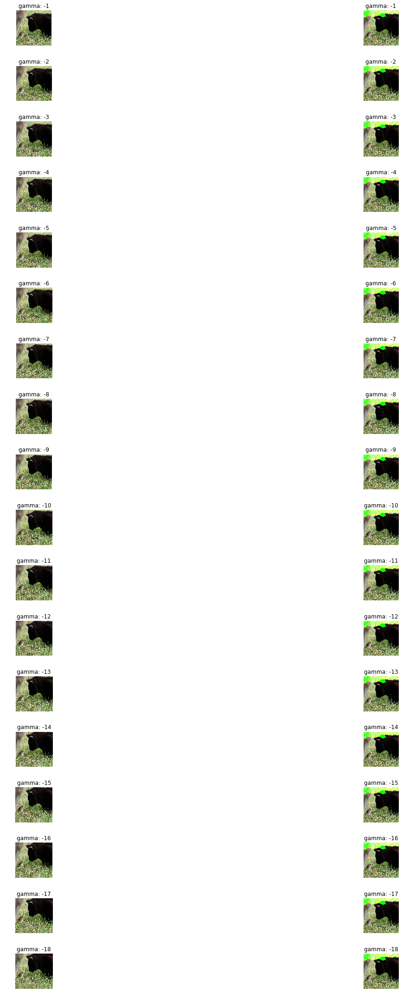

In [75]:
# Testing: Adding small shifts to the image, checking corresponding decisions

# Original prediction
alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
preds = inet_model.predict(np.array([alter_image]))
print("Original Prediction:")
for x in decode_predictions(preds)[0]:
    print(x)
print()

cols, rows = 2, 18
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(30, 30))
i = 0

print("Testing Vertical Shifts ...\n")
# Using negative gammas / pixel shifts (downwards is the positive direction)
for gamma in [x for x in range(-1, -19, -1)]:
    print("gamma = " + str(gamma))
    alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
    alter_image[:gamma] = alter_image[-gamma:]
    alter_image = alter_image[-gamma:]
    preds = inet_model.predict(np.array([alter_image]))
    tup = decode_predictions(preds)[0][0]
    for x in decode_predictions(preds)[0]:
        print(x)
    print()

    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex_3 = lime_image.LimeImageExplainer()
    expl_3 = ex_3.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl_3.top_labels))
    temp, mask = expl_3.get_image_and_mask(expl_3.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1

plt.tight_layout()
plt.show()

Contributing features in original:


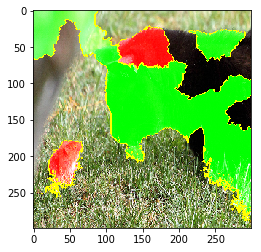

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")

Original Prediction:
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)

Testing Vertical Shifts ...

gamma = 1
('n02133161', 'American_black_bear', 0.8352825)
('n01883070', 'wombat', 0.025936732)
('n02105056', 'groenendael', 0.013512954)
('n01877812', 'wallaby', 0.012103776)
('n02104365', 'schipperke', 0.011347325)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



[295, 106, 224, 104, 223]
gamma = 2
('n02133161', 'American_black_bear', 0.8352825)
('n01883070', 'wombat', 0.025936732)
('n02105056', 'groenendael', 0.013512954)
('n01877812', 'wallaby', 0.012103776)
('n02104365', 'schipperke', 0.011347325)


[295, 106, 224, 104, 223]
gamma = 3
('n02133161', 'American_black_bear', 0.8352825)
('n01883070', 'wombat', 0.025936732)
('n02105056', 'groenendael', 0.013512954)
('n01877812', 'wallaby', 0.012103776)
('n02104365', 'schipperke', 0.011347325)


[295, 106, 224, 104, 223]
gamma = 4
('n02133161', 'American_black_bear', 0.8352825)
('n01883070', 'wombat', 0.025936732)
('n02105056', 'groenendael', 0.013512954)
('n01877812', 'wallaby', 0.012103776)
('n02104365', 'schipperke', 0.011347325)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.169020e-17
  overwrite_a=False)



[295, 106, 224, 104, 223]
gamma = 5
('n02133161', 'American_black_bear', 0.8352825)
('n01883070', 'wombat', 0.025936732)
('n02105056', 'groenendael', 0.013512954)
('n01877812', 'wallaby', 0.012103776)
('n02104365', 'schipperke', 0.011347325)


[295, 106, 224, 104, 223]
gamma = 6
('n02133161', 'American_black_bear', 0.8352825)
('n01883070', 'wombat', 0.025936732)
('n02105056', 'groenendael', 0.013512954)
('n01877812', 'wallaby', 0.012103776)
('n02104365', 'schipperke', 0.011347325)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.021782e-17
  overwrite_a=False)



[295, 106, 224, 104, 223]
gamma = 7
('n02133161', 'American_black_bear', 0.8157077)
('n01883070', 'wombat', 0.031886514)
('n01877812', 'wallaby', 0.014584733)
('n02105056', 'groenendael', 0.0138656)
('n02104365', 'schipperke', 0.011659877)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number6.614775e-18
  overwrite_a=False)



[295, 106, 104, 224, 223]
gamma = 8
('n02133161', 'American_black_bear', 0.8157077)
('n01883070', 'wombat', 0.031886514)
('n01877812', 'wallaby', 0.014584733)
('n02105056', 'groenendael', 0.0138656)
('n02104365', 'schipperke', 0.011659877)


[295, 106, 104, 224, 223]
gamma = 9
('n02133161', 'American_black_bear', 0.8493987)
('n01883070', 'wombat', 0.018797785)
('n02105056', 'groenendael', 0.013675316)
('n02104365', 'schipperke', 0.0099049285)
('n01877812', 'wallaby', 0.008967909)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.459004e-17
  overwrite_a=False)



[295, 106, 224, 223, 104]
gamma = 10
('n02133161', 'American_black_bear', 0.8493987)
('n01883070', 'wombat', 0.018797785)
('n02105056', 'groenendael', 0.013675316)
('n02104365', 'schipperke', 0.0099049285)
('n01877812', 'wallaby', 0.008967909)


[295, 106, 224, 223, 104]
gamma = 11
('n02133161', 'American_black_bear', 0.8493987)
('n01883070', 'wombat', 0.018797785)
('n02105056', 'groenendael', 0.013675316)
('n02104365', 'schipperke', 0.0099049285)
('n01877812', 'wallaby', 0.008967909)


[295, 106, 224, 223, 104]
gamma = 12
('n02133161', 'American_black_bear', 0.8493987)
('n01883070', 'wombat', 0.018797785)
('n02105056', 'groenendael', 0.013675316)
('n02104365', 'schipperke', 0.0099049285)
('n01877812', 'wallaby', 0.008967909)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.627609e-18
  overwrite_a=False)



[295, 106, 224, 223, 104]
gamma = 13
('n02133161', 'American_black_bear', 0.8493987)
('n01883070', 'wombat', 0.018797785)
('n02105056', 'groenendael', 0.013675316)
('n02104365', 'schipperke', 0.0099049285)
('n01877812', 'wallaby', 0.008967909)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.604707e-17
  overwrite_a=False)



[295, 106, 224, 223, 104]
gamma = 14
('n02133161', 'American_black_bear', 0.8493987)
('n01883070', 'wombat', 0.018797785)
('n02105056', 'groenendael', 0.013675316)
('n02104365', 'schipperke', 0.0099049285)
('n01877812', 'wallaby', 0.008967909)


[295, 106, 224, 223, 104]
gamma = 15
('n02133161', 'American_black_bear', 0.8135135)
('n01883070', 'wombat', 0.034478225)
('n02105056', 'groenendael', 0.015867585)
('n01877812', 'wallaby', 0.011680457)
('n02104365', 'schipperke', 0.011387633)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.114227e-17
  overwrite_a=False)



[295, 106, 224, 104, 223]
gamma = 16
('n02133161', 'American_black_bear', 0.8135135)
('n01883070', 'wombat', 0.034478225)
('n02105056', 'groenendael', 0.015867585)
('n01877812', 'wallaby', 0.011680457)
('n02104365', 'schipperke', 0.011387633)


[295, 106, 224, 104, 223]
gamma = 17
('n02133161', 'American_black_bear', 0.8884951)
('n02105056', 'groenendael', 0.016050255)
('n02104365', 'schipperke', 0.010737081)
('n01877812', 'wallaby', 0.008990952)
('n01883070', 'wombat', 0.0076142643)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.622899e-18
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 18
('n02133161', 'American_black_bear', 0.8884951)
('n02105056', 'groenendael', 0.016050255)
('n02104365', 'schipperke', 0.010737081)
('n01877812', 'wallaby', 0.008990952)
('n01883070', 'wombat', 0.0076142643)


[295, 224, 223, 104, 106]
gamma = 19
('n02133161', 'American_black_bear', 0.8884951)
('n02105056', 'groenendael', 0.016050255)
('n02104365', 'schipperke', 0.010737081)
('n01877812', 'wallaby', 0.008990952)
('n01883070', 'wombat', 0.0076142643)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.715576e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 20
('n02133161', 'American_black_bear', 0.8884951)
('n02105056', 'groenendael', 0.016050255)
('n02104365', 'schipperke', 0.010737081)
('n01877812', 'wallaby', 0.008990952)
('n01883070', 'wombat', 0.0076142643)


[295, 224, 223, 104, 106]
gamma = 21
('n02133161', 'American_black_bear', 0.8884951)
('n02105056', 'groenendael', 0.016050255)
('n02104365', 'schipperke', 0.010737081)
('n01877812', 'wallaby', 0.008990952)
('n01883070', 'wombat', 0.0076142643)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.292193e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 22
('n02133161', 'American_black_bear', 0.8884951)
('n02105056', 'groenendael', 0.016050255)
('n02104365', 'schipperke', 0.010737081)
('n01877812', 'wallaby', 0.008990952)
('n01883070', 'wombat', 0.0076142643)


[295, 224, 223, 104, 106]
gamma = 23
('n02133161', 'American_black_bear', 0.87453675)
('n02105056', 'groenendael', 0.019657813)
('n02104365', 'schipperke', 0.012656526)
('n01877812', 'wallaby', 0.011081189)
('n01883070', 'wombat', 0.008388485)


[295, 224, 223, 104, 106]
gamma = 24
('n02133161', 'American_black_bear', 0.87453675)
('n02105056', 'groenendael', 0.019657813)
('n02104365', 'schipperke', 0.012656526)
('n01877812', 'wallaby', 0.011081189)
('n01883070', 'wombat', 0.008388485)


[295, 224, 223, 104, 106]
gamma = 25
('n02133161', 'American_black_bear', 0.88855636)
('n02105056', 'groenendael', 0.0154330935)
('n02104365', 'schipperke', 0.00964092)
('n01883070', 'wombat', 0.007923068)
('n01877812', 'wallaby', 0.006975545)


[295, 224, 223,

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.187756e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 28
('n02133161', 'American_black_bear', 0.88855636)
('n02105056', 'groenendael', 0.0154330935)
('n02104365', 'schipperke', 0.00964092)
('n01883070', 'wombat', 0.007923068)
('n01877812', 'wallaby', 0.006975545)


[295, 224, 223, 106, 104]
gamma = 29
('n02133161', 'American_black_bear', 0.88855636)
('n02105056', 'groenendael', 0.0154330935)
('n02104365', 'schipperke', 0.00964092)
('n01883070', 'wombat', 0.007923068)
('n01877812', 'wallaby', 0.006975545)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.928004e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 30
('n02133161', 'American_black_bear', 0.88855636)
('n02105056', 'groenendael', 0.0154330935)
('n02104365', 'schipperke', 0.00964092)
('n01883070', 'wombat', 0.007923068)
('n01877812', 'wallaby', 0.006975545)


[295, 224, 223, 106, 104]
gamma = 31
('n02133161', 'American_black_bear', 0.81451553)
('n02105056', 'groenendael', 0.030820405)
('n02104365', 'schipperke', 0.019467916)
('n01883070', 'wombat', 0.016295336)
('n01877812', 'wallaby', 0.012731801)


[295, 224, 223, 106, 104]
gamma = 32
('n02133161', 'American_black_bear', 0.81451553)
('n02105056', 'groenendael', 0.030820405)
('n02104365', 'schipperke', 0.019467916)
('n01883070', 'wombat', 0.016295336)
('n01877812', 'wallaby', 0.012731801)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.845758e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 33
('n02133161', 'American_black_bear', 0.94732034)
('n02105056', 'groenendael', 0.008127479)
('n01883070', 'wombat', 0.006525694)
('n02104365', 'schipperke', 0.0060016173)
('n01877812', 'wallaby', 0.002975753)


[295, 224, 106, 223, 104]
gamma = 34
('n02133161', 'American_black_bear', 0.94732034)
('n02105056', 'groenendael', 0.008127479)
('n01883070', 'wombat', 0.006525694)
('n02104365', 'schipperke', 0.0060016173)
('n01877812', 'wallaby', 0.002975753)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.331853e-17
  overwrite_a=False)



[295, 224, 106, 223, 104]
gamma = 35
('n02133161', 'American_black_bear', 0.94732034)
('n02105056', 'groenendael', 0.008127479)
('n01883070', 'wombat', 0.006525694)
('n02104365', 'schipperke', 0.0060016173)
('n01877812', 'wallaby', 0.002975753)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number5.732021e-18
  overwrite_a=False)



[295, 224, 106, 223, 104]
gamma = 36
('n02133161', 'American_black_bear', 0.94732034)
('n02105056', 'groenendael', 0.008127479)
('n01883070', 'wombat', 0.006525694)
('n02104365', 'schipperke', 0.0060016173)
('n01877812', 'wallaby', 0.002975753)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.296396e-17
  overwrite_a=False)



[295, 224, 106, 223, 104]
gamma = 37
('n02133161', 'American_black_bear', 0.94732034)
('n02105056', 'groenendael', 0.008127479)
('n01883070', 'wombat', 0.006525694)
('n02104365', 'schipperke', 0.0060016173)
('n01877812', 'wallaby', 0.002975753)


[295, 224, 106, 223, 104]
gamma = 38
('n02133161', 'American_black_bear', 0.94732034)
('n02105056', 'groenendael', 0.008127479)
('n01883070', 'wombat', 0.006525694)
('n02104365', 'schipperke', 0.0060016173)
('n01877812', 'wallaby', 0.002975753)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.455507e-17
  overwrite_a=False)



[295, 224, 106, 223, 104]
gamma = 39
('n02133161', 'American_black_bear', 0.9451629)
('n02105056', 'groenendael', 0.009191167)
('n01883070', 'wombat', 0.007022032)
('n02104365', 'schipperke', 0.006838508)
('n01877812', 'wallaby', 0.0030786772)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number6.768529e-17
  overwrite_a=False)



[295, 224, 106, 223, 104]
gamma = 40
('n02133161', 'American_black_bear', 0.9451629)
('n02105056', 'groenendael', 0.009191167)
('n01883070', 'wombat', 0.007022032)
('n02104365', 'schipperke', 0.006838508)
('n01877812', 'wallaby', 0.0030786772)


[295, 224, 106, 223, 104]
gamma = 41
('n02133161', 'American_black_bear', 0.9482547)
('n02105056', 'groenendael', 0.008500006)
('n02104365', 'schipperke', 0.0051149307)
('n01883070', 'wombat', 0.0046279887)
('n02127052', 'lynx', 0.002183534)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.319916e-17
  overwrite_a=False)



[295, 224, 223, 106, 287]
gamma = 42
('n02133161', 'American_black_bear', 0.9482547)
('n02105056', 'groenendael', 0.008500006)
('n02104365', 'schipperke', 0.0051149307)
('n01883070', 'wombat', 0.0046279887)
('n02127052', 'lynx', 0.002183534)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.210351e-18
  overwrite_a=False)



[295, 224, 223, 106, 287]
gamma = 43
('n02133161', 'American_black_bear', 0.9482547)
('n02105056', 'groenendael', 0.008500006)
('n02104365', 'schipperke', 0.0051149307)
('n01883070', 'wombat', 0.0046279887)
('n02127052', 'lynx', 0.002183534)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number9.167993e-18
  overwrite_a=False)



[295, 224, 223, 106, 287]
gamma = 44
('n02133161', 'American_black_bear', 0.9482547)
('n02105056', 'groenendael', 0.008500006)
('n02104365', 'schipperke', 0.0051149307)
('n01883070', 'wombat', 0.0046279887)
('n02127052', 'lynx', 0.002183534)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number5.208270e-17
  overwrite_a=False)



[295, 224, 223, 106, 287]
gamma = 45
('n02133161', 'American_black_bear', 0.9482547)
('n02105056', 'groenendael', 0.008500006)
('n02104365', 'schipperke', 0.0051149307)
('n01883070', 'wombat', 0.0046279887)
('n02127052', 'lynx', 0.002183534)


[295, 224, 223, 106, 287]
gamma = 46
('n02133161', 'American_black_bear', 0.9482547)
('n02105056', 'groenendael', 0.008500006)
('n02104365', 'schipperke', 0.0051149307)
('n01883070', 'wombat', 0.0046279887)
('n02127052', 'lynx', 0.002183534)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.750894e-17
  overwrite_a=False)



[295, 224, 223, 106, 287]
gamma = 47
('n02133161', 'American_black_bear', 0.91297877)
('n02105056', 'groenendael', 0.023398403)
('n02104365', 'schipperke', 0.01374872)
('n01883070', 'wombat', 0.00844907)
('n02112137', 'chow', 0.0036106012)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.371939e-17
  overwrite_a=False)



[295, 224, 223, 106, 260]
gamma = 48
('n02133161', 'American_black_bear', 0.91297877)
('n02105056', 'groenendael', 0.023398403)
('n02104365', 'schipperke', 0.01374872)
('n01883070', 'wombat', 0.00844907)
('n02112137', 'chow', 0.0036106012)


[295, 224, 223, 106, 260]
gamma = 49
('n02133161', 'American_black_bear', 0.9484747)
('n02105056', 'groenendael', 0.014145965)
('n02104365', 'schipperke', 0.009043269)
('n01883070', 'wombat', 0.0036129272)
('n01877812', 'wallaby', 0.002864966)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.712729e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 50
('n02133161', 'American_black_bear', 0.9484747)
('n02105056', 'groenendael', 0.014145965)
('n02104365', 'schipperke', 0.009043269)
('n01883070', 'wombat', 0.0036129272)
('n01877812', 'wallaby', 0.002864966)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.654917e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 51
('n02133161', 'American_black_bear', 0.9484747)
('n02105056', 'groenendael', 0.014145965)
('n02104365', 'schipperke', 0.009043269)
('n01883070', 'wombat', 0.0036129272)
('n01877812', 'wallaby', 0.002864966)


[295, 224, 223, 106, 104]
gamma = 52
('n02133161', 'American_black_bear', 0.9484747)
('n02105056', 'groenendael', 0.014145965)
('n02104365', 'schipperke', 0.009043269)
('n01883070', 'wombat', 0.0036129272)
('n01877812', 'wallaby', 0.002864966)


[295, 224, 223, 106, 104]
gamma = 53
('n02133161', 'American_black_bear', 0.9484747)
('n02105056', 'groenendael', 0.014145965)
('n02104365', 'schipperke', 0.009043269)
('n01883070', 'wombat', 0.0036129272)
('n01877812', 'wallaby', 0.002864966)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.654165e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 54
('n02133161', 'American_black_bear', 0.9484747)
('n02105056', 'groenendael', 0.014145965)
('n02104365', 'schipperke', 0.009043269)
('n01883070', 'wombat', 0.0036129272)
('n01877812', 'wallaby', 0.002864966)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number8.819600e-18
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 55
('n02133161', 'American_black_bear', 0.9360374)
('n02105056', 'groenendael', 0.01668705)
('n02104365', 'schipperke', 0.01251295)
('n01877812', 'wallaby', 0.0051144613)
('n01883070', 'wombat', 0.004928195)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.537196e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 56
('n02133161', 'American_black_bear', 0.9360374)
('n02105056', 'groenendael', 0.01668705)
('n02104365', 'schipperke', 0.01251295)
('n01877812', 'wallaby', 0.0051144613)
('n01883070', 'wombat', 0.004928195)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.252957e-18
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 57
('n02133161', 'American_black_bear', 0.9484171)
('n02105056', 'groenendael', 0.0116464365)
('n02104365', 'schipperke', 0.007824329)
('n01883070', 'wombat', 0.005330968)
('n01877812', 'wallaby', 0.0030907271)


[295, 224, 223, 106, 104]
gamma = 58
('n02133161', 'American_black_bear', 0.9484171)
('n02105056', 'groenendael', 0.0116464365)
('n02104365', 'schipperke', 0.007824329)
('n01883070', 'wombat', 0.005330968)
('n01877812', 'wallaby', 0.0030907271)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.530998e-18
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 59
('n02133161', 'American_black_bear', 0.9484171)
('n02105056', 'groenendael', 0.0116464365)
('n02104365', 'schipperke', 0.007824329)
('n01883070', 'wombat', 0.005330968)
('n01877812', 'wallaby', 0.0030907271)


[295, 224, 223, 106, 104]
gamma = 60
('n02133161', 'American_black_bear', 0.9484171)
('n02105056', 'groenendael', 0.0116464365)
('n02104365', 'schipperke', 0.007824329)
('n01883070', 'wombat', 0.005330968)
('n01877812', 'wallaby', 0.0030907271)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.122153e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 61
('n02133161', 'American_black_bear', 0.9484171)
('n02105056', 'groenendael', 0.0116464365)
('n02104365', 'schipperke', 0.007824329)
('n01883070', 'wombat', 0.005330968)
('n01877812', 'wallaby', 0.0030907271)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.698397e-18
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 62
('n02133161', 'American_black_bear', 0.9484171)
('n02105056', 'groenendael', 0.0116464365)
('n02104365', 'schipperke', 0.007824329)
('n01883070', 'wombat', 0.005330968)
('n01877812', 'wallaby', 0.0030907271)


[295, 224, 223, 106, 104]
gamma = 63
('n02133161', 'American_black_bear', 0.9353809)
('n02105056', 'groenendael', 0.021371523)
('n02104365', 'schipperke', 0.011073562)
('n01883070', 'wombat', 0.004951707)
('n01877812', 'wallaby', 0.0031505988)


[295, 224, 223, 106, 104]
gamma = 64
('n02133161', 'American_black_bear', 0.9353809)
('n02105056', 'groenendael', 0.021371523)
('n02104365', 'schipperke', 0.011073562)
('n01883070', 'wombat', 0.004951707)
('n01877812', 'wallaby', 0.0031505988)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.027989e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 65
('n02133161', 'American_black_bear', 0.99308455)
('n02105056', 'groenendael', 0.0022631658)
('n02104365', 'schipperke', 0.0015994954)
('n01883070', 'wombat', 0.00087241665)
('n02114367', 'timber_wolf', 0.00043515235)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.216354e-17
  overwrite_a=False)



[295, 224, 223, 106, 269]
gamma = 66
('n02133161', 'American_black_bear', 0.99308455)
('n02105056', 'groenendael', 0.0022631658)
('n02104365', 'schipperke', 0.0015994954)
('n01883070', 'wombat', 0.00087241665)
('n02114367', 'timber_wolf', 0.00043515235)


[295, 224, 223, 106, 269]
gamma = 67
('n02133161', 'American_black_bear', 0.99308455)
('n02105056', 'groenendael', 0.0022631658)
('n02104365', 'schipperke', 0.0015994954)
('n01883070', 'wombat', 0.00087241665)
('n02114367', 'timber_wolf', 0.00043515235)


[295, 224, 223, 106, 269]
gamma = 68
('n02133161', 'American_black_bear', 0.99308455)
('n02105056', 'groenendael', 0.0022631658)
('n02104365', 'schipperke', 0.0015994954)
('n01883070', 'wombat', 0.00087241665)
('n02114367', 'timber_wolf', 0.00043515235)


[295, 224, 223, 106, 269]
gamma = 69
('n02133161', 'American_black_bear', 0.99308455)
('n02105056', 'groenendael', 0.0022631658)
('n02104365', 'schipperke', 0.0015994954)
('n01883070', 'wombat', 0.00087241665)
('n02114367', 'timber

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number9.462944e-18
  overwrite_a=False)



[295, 224, 223, 106, 269]
gamma = 72
('n02133161', 'American_black_bear', 0.9871924)
('n02105056', 'groenendael', 0.0058126436)
('n02104365', 'schipperke', 0.0035841337)
('n01883070', 'wombat', 0.0006555039)
('n02114367', 'timber_wolf', 0.00050526985)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.631442e-17
  overwrite_a=False)



[295, 224, 223, 106, 269]
gamma = 73
('n02133161', 'American_black_bear', 0.98796)
('n02105056', 'groenendael', 0.0059386203)
('n02104365', 'schipperke', 0.0023484484)
('n01883070', 'wombat', 0.00065021764)
('n02114367', 'timber_wolf', 0.0006208086)


[295, 224, 223, 106, 269]
gamma = 74
('n02133161', 'American_black_bear', 0.98796)
('n02105056', 'groenendael', 0.0059386203)
('n02104365', 'schipperke', 0.0023484484)
('n01883070', 'wombat', 0.00065021764)
('n02114367', 'timber_wolf', 0.0006208086)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.477494e-17
  overwrite_a=False)



[295, 224, 223, 106, 269]
gamma = 75
('n02133161', 'American_black_bear', 0.98796)
('n02105056', 'groenendael', 0.0059386203)
('n02104365', 'schipperke', 0.0023484484)
('n01883070', 'wombat', 0.00065021764)
('n02114367', 'timber_wolf', 0.0006208086)


[295, 224, 223, 106, 269]
gamma = 76
('n02133161', 'American_black_bear', 0.98796)
('n02105056', 'groenendael', 0.0059386203)
('n02104365', 'schipperke', 0.0023484484)
('n01883070', 'wombat', 0.00065021764)
('n02114367', 'timber_wolf', 0.0006208086)


[295, 224, 223, 106, 269]
gamma = 77
('n02133161', 'American_black_bear', 0.98796)
('n02105056', 'groenendael', 0.0059386203)
('n02104365', 'schipperke', 0.0023484484)
('n01883070', 'wombat', 0.00065021764)
('n02114367', 'timber_wolf', 0.0006208086)


[295, 224, 223, 106, 269]
gamma = 78
('n02133161', 'American_black_bear', 0.98796)
('n02105056', 'groenendael', 0.0059386203)
('n02104365', 'schipperke', 0.0023484484)
('n01883070', 'wombat', 0.00065021764)
('n02114367', 'timber_wolf', 0.00062

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.332927e-17
  overwrite_a=False)



[295, 224, 223, 106, 269]
gamma = 79
('n02133161', 'American_black_bear', 0.96878314)
('n02105056', 'groenendael', 0.017788714)
('n02104365', 'schipperke', 0.0070101987)
('n02114367', 'timber_wolf', 0.0008911554)
('n01883070', 'wombat', 0.0008660382)


[295, 224, 223, 269, 106]
gamma = 80
('n02133161', 'American_black_bear', 0.96878314)
('n02105056', 'groenendael', 0.017788714)
('n02104365', 'schipperke', 0.0070101987)
('n02114367', 'timber_wolf', 0.0008911554)
('n01883070', 'wombat', 0.0008660382)


[295, 224, 223, 269, 106]
gamma = 81
('n02133161', 'American_black_bear', 0.9937224)
('n02104365', 'schipperke', 0.0038903)
('n02105056', 'groenendael', 0.0011801639)
('n02114367', 'timber_wolf', 0.0003251963)
('n02132136', 'brown_bear', 0.00010836968)


[295, 223, 224, 269, 294]
gamma = 82
('n02133161', 'American_black_bear', 0.9937224)
('n02104365', 'schipperke', 0.0038903)
('n02105056', 'groenendael', 0.0011801639)
('n02114367', 'timber_wolf', 0.0003251963)
('n02132136', 'brown_bear', 

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.336981e-17
  overwrite_a=False)



[295, 223, 224, 269, 294]
gamma = 84
('n02133161', 'American_black_bear', 0.9937224)
('n02104365', 'schipperke', 0.0038903)
('n02105056', 'groenendael', 0.0011801639)
('n02114367', 'timber_wolf', 0.0003251963)
('n02132136', 'brown_bear', 0.00010836968)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.767765e-17
  overwrite_a=False)



[295, 223, 224, 269, 294]
gamma = 85
('n02133161', 'American_black_bear', 0.9937224)
('n02104365', 'schipperke', 0.0038903)
('n02105056', 'groenendael', 0.0011801639)
('n02114367', 'timber_wolf', 0.0003251963)
('n02132136', 'brown_bear', 0.00010836968)


[295, 223, 224, 269, 294]
gamma = 86
('n02133161', 'American_black_bear', 0.9937224)
('n02104365', 'schipperke', 0.0038903)
('n02105056', 'groenendael', 0.0011801639)
('n02114367', 'timber_wolf', 0.0003251963)
('n02132136', 'brown_bear', 0.00010836968)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.378469e-17
  overwrite_a=False)



[295, 223, 224, 269, 294]
gamma = 87
('n02133161', 'American_black_bear', 0.9876901)
('n02104365', 'schipperke', 0.008815143)
('n02105056', 'groenendael', 0.0018676748)
('n02114367', 'timber_wolf', 0.00039113607)
('n01877812', 'wallaby', 0.00018323063)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.946798e-17
  overwrite_a=False)



[295, 223, 224, 269, 104]
gamma = 88
('n02133161', 'American_black_bear', 0.9876901)
('n02104365', 'schipperke', 0.008815143)
('n02105056', 'groenendael', 0.0018676748)
('n02114367', 'timber_wolf', 0.00039113607)
('n01877812', 'wallaby', 0.00018323063)


[295, 223, 224, 269, 104]
gamma = 89
('n02133161', 'American_black_bear', 0.98847187)
('n02104365', 'schipperke', 0.0069909752)
('n02105056', 'groenendael', 0.0018705511)
('n02114367', 'timber_wolf', 0.0006031433)
('n01877812', 'wallaby', 0.0003764521)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.142919e-17
  overwrite_a=False)



[295, 223, 224, 269, 104]
gamma = 90
('n02133161', 'American_black_bear', 0.98847187)
('n02104365', 'schipperke', 0.0069909752)
('n02105056', 'groenendael', 0.0018705511)
('n02114367', 'timber_wolf', 0.0006031433)
('n01877812', 'wallaby', 0.0003764521)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.141622e-17
  overwrite_a=False)



[295, 223, 224, 269, 104]
gamma = 91
('n02133161', 'American_black_bear', 0.98847187)
('n02104365', 'schipperke', 0.0069909752)
('n02105056', 'groenendael', 0.0018705511)
('n02114367', 'timber_wolf', 0.0006031433)
('n01877812', 'wallaby', 0.0003764521)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.488815e-17
  overwrite_a=False)



[295, 223, 224, 269, 104]
gamma = 92
('n02133161', 'American_black_bear', 0.98847187)
('n02104365', 'schipperke', 0.0069909752)
('n02105056', 'groenendael', 0.0018705511)
('n02114367', 'timber_wolf', 0.0006031433)
('n01877812', 'wallaby', 0.0003764521)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.879251e-18
  overwrite_a=False)



[295, 223, 224, 269, 104]
gamma = 93
('n02133161', 'American_black_bear', 0.98847187)
('n02104365', 'schipperke', 0.0069909752)
('n02105056', 'groenendael', 0.0018705511)
('n02114367', 'timber_wolf', 0.0006031433)
('n01877812', 'wallaby', 0.0003764521)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.860905e-17
  overwrite_a=False)



[295, 223, 224, 269, 104]
gamma = 94
('n02133161', 'American_black_bear', 0.98847187)
('n02104365', 'schipperke', 0.0069909752)
('n02105056', 'groenendael', 0.0018705511)
('n02114367', 'timber_wolf', 0.0006031433)
('n01877812', 'wallaby', 0.0003764521)


[295, 223, 224, 269, 104]
gamma = 95
('n02133161', 'American_black_bear', 0.98493564)
('n02104365', 'schipperke', 0.007423461)
('n02105056', 'groenendael', 0.0040942407)
('n02114367', 'timber_wolf', 0.0006767513)
('n01877812', 'wallaby', 0.00049219874)


[295, 223, 224, 269, 104]
gamma = 96
('n02133161', 'American_black_bear', 0.98493564)
('n02104365', 'schipperke', 0.007423461)
('n02105056', 'groenendael', 0.0040942407)
('n02114367', 'timber_wolf', 0.0006767513)
('n01877812', 'wallaby', 0.00049219874)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.073961e-17
  overwrite_a=False)



[295, 223, 224, 269, 104]
gamma = 97
('n02133161', 'American_black_bear', 0.9969511)
('n02104365', 'schipperke', 0.0016723684)
('n02105056', 'groenendael', 0.001009351)
('n02114367', 'timber_wolf', 0.00021908243)
('n02110063', 'malamute', 6.0742033e-05)


[295, 223, 224, 269, 249]
gamma = 98
('n02133161', 'American_black_bear', 0.9969511)
('n02104365', 'schipperke', 0.0016723684)
('n02105056', 'groenendael', 0.001009351)
('n02114367', 'timber_wolf', 0.00021908243)
('n02110063', 'malamute', 6.0742033e-05)


[295, 223, 224, 269, 249]
gamma = 99
('n02133161', 'American_black_bear', 0.9969511)
('n02104365', 'schipperke', 0.0016723684)
('n02105056', 'groenendael', 0.001009351)
('n02114367', 'timber_wolf', 0.00021908243)
('n02110063', 'malamute', 6.0742033e-05)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.074833e-17
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 100
('n02133161', 'American_black_bear', 0.9969511)
('n02104365', 'schipperke', 0.0016723684)
('n02105056', 'groenendael', 0.001009351)
('n02114367', 'timber_wolf', 0.00021908243)
('n02110063', 'malamute', 6.0742033e-05)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.071826e-17
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 101
('n02133161', 'American_black_bear', 0.9969511)
('n02104365', 'schipperke', 0.0016723684)
('n02105056', 'groenendael', 0.001009351)
('n02114367', 'timber_wolf', 0.00021908243)
('n02110063', 'malamute', 6.0742033e-05)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.157649e-17
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 102
('n02133161', 'American_black_bear', 0.9969511)
('n02104365', 'schipperke', 0.0016723684)
('n02105056', 'groenendael', 0.001009351)
('n02114367', 'timber_wolf', 0.00021908243)
('n02110063', 'malamute', 6.0742033e-05)


[295, 223, 224, 269, 249]
gamma = 103
('n02133161', 'American_black_bear', 0.99714917)
('n02104365', 'schipperke', 0.0016589111)
('n02105056', 'groenendael', 0.0009028251)
('n02114367', 'timber_wolf', 0.00016158923)
('n02110063', 'malamute', 5.0292427e-05)


[295, 223, 224, 269, 249]
gamma = 104
('n02133161', 'American_black_bear', 0.99714917)
('n02104365', 'schipperke', 0.0016589111)
('n02105056', 'groenendael', 0.0009028251)
('n02114367', 'timber_wolf', 0.00016158923)
('n02110063', 'malamute', 5.0292427e-05)


[295, 223, 224, 269, 249]
gamma = 105
('n02133161', 'American_black_bear', 0.99339926)
('n02104365', 'schipperke', 0.003916473)
('n02105056', 'groenendael', 0.0016474216)
('n02114367', 'timber_wolf', 0.0005789273)
('n0211006

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.224975e-17
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 109
('n02133161', 'American_black_bear', 0.99339926)
('n02104365', 'schipperke', 0.003916473)
('n02105056', 'groenendael', 0.0016474216)
('n02114367', 'timber_wolf', 0.0005789273)
('n02110063', 'malamute', 0.0003050468)


[295, 223, 224, 269, 249]
gamma = 110
('n02133161', 'American_black_bear', 0.99339926)
('n02104365', 'schipperke', 0.003916473)
('n02105056', 'groenendael', 0.0016474216)
('n02114367', 'timber_wolf', 0.0005789273)
('n02110063', 'malamute', 0.0003050468)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.832378e-17
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 111
('n02133161', 'American_black_bear', 0.99720395)
('n02104365', 'schipperke', 0.001515767)
('n02105056', 'groenendael', 0.0010900992)
('n02114367', 'timber_wolf', 9.557648e-05)
('n02110063', 'malamute', 2.7675824e-05)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.933614e-17
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 112
('n02133161', 'American_black_bear', 0.99720395)
('n02104365', 'schipperke', 0.001515767)
('n02105056', 'groenendael', 0.0010900992)
('n02114367', 'timber_wolf', 9.557648e-05)
('n02110063', 'malamute', 2.7675824e-05)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.624690e-17
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 113
('n02133161', 'American_black_bear', 0.97451276)
('n02104365', 'schipperke', 0.022748778)
('n02105056', 'groenendael', 0.0022904414)
('n02114367', 'timber_wolf', 0.00020342399)
('n02110063', 'malamute', 0.000119866876)


[295, 223, 224, 269, 249]
gamma = 114
('n02133161', 'American_black_bear', 0.97451276)
('n02104365', 'schipperke', 0.022748778)
('n02105056', 'groenendael', 0.0022904414)
('n02114367', 'timber_wolf', 0.00020342399)
('n02110063', 'malamute', 0.000119866876)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.569439e-17
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 115
('n02133161', 'American_black_bear', 0.97451276)
('n02104365', 'schipperke', 0.022748778)
('n02105056', 'groenendael', 0.0022904414)
('n02114367', 'timber_wolf', 0.00020342399)
('n02110063', 'malamute', 0.000119866876)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.134768e-17
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 116
('n02133161', 'American_black_bear', 0.97451276)
('n02104365', 'schipperke', 0.022748778)
('n02105056', 'groenendael', 0.0022904414)
('n02114367', 'timber_wolf', 0.00020342399)
('n02110063', 'malamute', 0.000119866876)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number9.170780e-18
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 117
('n02133161', 'American_black_bear', 0.97451276)
('n02104365', 'schipperke', 0.022748778)
('n02105056', 'groenendael', 0.0022904414)
('n02114367', 'timber_wolf', 0.00020342399)
('n02110063', 'malamute', 0.000119866876)


[295, 223, 224, 269, 249]
gamma = 118
('n02133161', 'American_black_bear', 0.97451276)
('n02104365', 'schipperke', 0.022748778)
('n02105056', 'groenendael', 0.0022904414)
('n02114367', 'timber_wolf', 0.00020342399)
('n02110063', 'malamute', 0.000119866876)


[295, 223, 224, 269, 249]
gamma = 119
('n02133161', 'American_black_bear', 0.9753025)
('n02104365', 'schipperke', 0.02166295)
('n02105056', 'groenendael', 0.002774847)
('n02114367', 'timber_wolf', 0.000113222755)
('n02110063', 'malamute', 5.2677526e-05)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number8.391379e-18
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 120
('n02133161', 'American_black_bear', 0.9753025)
('n02104365', 'schipperke', 0.02166295)
('n02105056', 'groenendael', 0.002774847)
('n02114367', 'timber_wolf', 0.000113222755)
('n02110063', 'malamute', 5.2677526e-05)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.288243e-17
  overwrite_a=False)



[295, 223, 224, 269, 249]
gamma = 121
('n02133161', 'American_black_bear', 0.859396)
('n02104365', 'schipperke', 0.13033512)
('n02105056', 'groenendael', 0.008137909)
('n02110063', 'malamute', 0.0013371087)
('n02114367', 'timber_wolf', 0.00043714204)


[295, 223, 224, 249, 269]
gamma = 122
('n02133161', 'American_black_bear', 0.859396)
('n02104365', 'schipperke', 0.13033512)
('n02105056', 'groenendael', 0.008137909)
('n02110063', 'malamute', 0.0013371087)
('n02114367', 'timber_wolf', 0.00043714204)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number9.643275e-18
  overwrite_a=False)



[295, 223, 224, 249, 269]
gamma = 123
('n02133161', 'American_black_bear', 0.859396)
('n02104365', 'schipperke', 0.13033512)
('n02105056', 'groenendael', 0.008137909)
('n02110063', 'malamute', 0.0013371087)
('n02114367', 'timber_wolf', 0.00043714204)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.502968e-17
  overwrite_a=False)



[295, 223, 224, 249, 269]
gamma = 124
('n02133161', 'American_black_bear', 0.859396)
('n02104365', 'schipperke', 0.13033512)
('n02105056', 'groenendael', 0.008137909)
('n02110063', 'malamute', 0.0013371087)
('n02114367', 'timber_wolf', 0.00043714204)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.487615e-17
  overwrite_a=False)



[295, 223, 224, 249, 269]
gamma = 125
('n02133161', 'American_black_bear', 0.859396)
('n02104365', 'schipperke', 0.13033512)
('n02105056', 'groenendael', 0.008137909)
('n02110063', 'malamute', 0.0013371087)
('n02114367', 'timber_wolf', 0.00043714204)


[295, 223, 224, 249, 269]
gamma = 126
('n02133161', 'American_black_bear', 0.859396)
('n02104365', 'schipperke', 0.13033512)
('n02105056', 'groenendael', 0.008137909)
('n02110063', 'malamute', 0.0013371087)
('n02114367', 'timber_wolf', 0.00043714204)


[295, 223, 224, 249, 269]
gamma = 127
('n02133161', 'American_black_bear', 0.9790344)
('n02104365', 'schipperke', 0.01919569)
('n02105056', 'groenendael', 0.001702982)
('n02114367', 'timber_wolf', 2.7931948e-05)
('n02110063', 'malamute', 1.782374e-05)


[295, 223, 224, 269, 249]
gamma = 128
('n02133161', 'American_black_bear', 0.9790344)
('n02104365', 'schipperke', 0.01919569)
('n02105056', 'groenendael', 0.001702982)
('n02114367', 'timber_wolf', 2.7931948e-05)
('n02110063', 'malamute', 1

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.351260e-17
  overwrite_a=False)



[223, 295, 224, 249, 269]


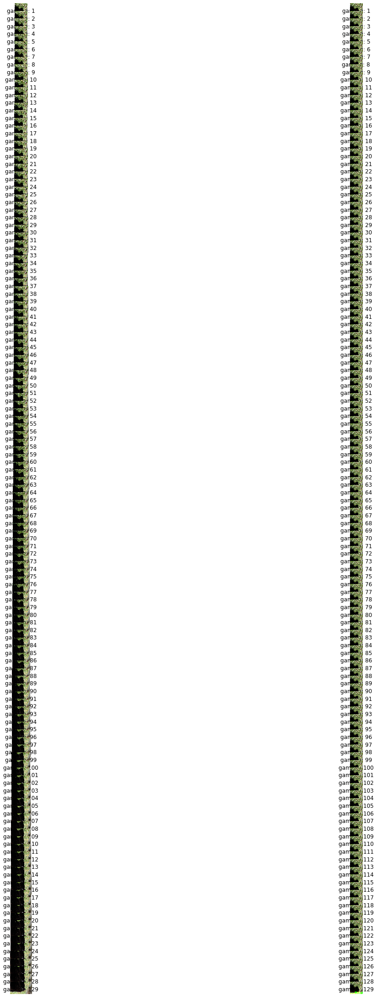

In [76]:
# Testing: Adding small shifts to the image, checking corresponding decisions

# Original prediction
alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
preds = inet_model.predict(np.array([alter_image]))
print("Original Prediction:")
for x in decode_predictions(preds)[0]:
    print(x)
print()

cols, rows = 2, 129
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(30, 30))
i = 0

print("Testing Vertical Shifts ...\n")
# Positive gammas / pixel shifts downwards (downwards is the positive direction)
gamma = 1
prediction = "American_black_bear"
while prediction == "American_black_bear":
    print("gamma = " + str(gamma))
    alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
    alter_image[gamma:] = alter_image[:-gamma]
    alter_image = alter_image[gamma:]
    preds = inet_model.predict(np.array([alter_image]))
    tup = decode_predictions(preds)[0][0]
    for x in decode_predictions(preds)[0]:
        print(x)
    print()
    prediction = tup[1]
    
    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex_4 = lime_image.LimeImageExplainer()
    expl_4 = ex_4.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl_4.top_labels))
    temp, mask = expl_4.get_image_and_mask(expl_4.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    gamma += 1

plt.tight_layout()
plt.show()

Contributing features in original:


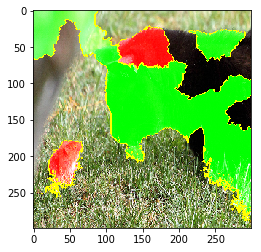

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")

Original Prediction:
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)

Testing Horizontal Shifts ...

gamma = -1
('n02133161', 'American_black_bear', 0.64832485)
('n02105056', 'groenendael', 0.046161015)
('n01877812', 'wallaby', 0.03359535)
('n02104365', 'schipperke', 0.020455686)
('n02119789', 'kit_fox', 0.013900795)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



[295, 224, 104, 223, 278]
gamma = -2
('n02133161', 'American_black_bear', 0.43699718)
('n02105056', 'groenendael', 0.0779119)
('n02119789', 'kit_fox', 0.050426587)
('n01877812', 'wallaby', 0.035699166)
('n02104365', 'schipperke', 0.035178598)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.810625e-17
  overwrite_a=False)



[295, 224, 278, 104, 223]
gamma = -3
('n02133161', 'American_black_bear', 0.25571555)
('n02105056', 'groenendael', 0.05779469)
('n01877812', 'wallaby', 0.04533092)
('n02119789', 'kit_fox', 0.037156925)
('n02127052', 'lynx', 0.030683435)


[295, 224, 104, 278, 287]
gamma = -4
('n02133161', 'American_black_bear', 0.4147852)
('n02105056', 'groenendael', 0.07874059)
('n02104365', 'schipperke', 0.04799601)
('n01877812', 'wallaby', 0.03925634)
('n02119789', 'kit_fox', 0.036054403)


[295, 224, 223, 104, 278]
gamma = -5
('n02133161', 'American_black_bear', 0.49269676)
('n02105056', 'groenendael', 0.047822237)
('n02119789', 'kit_fox', 0.040019765)
('n02104365', 'schipperke', 0.02969921)
('n01877812', 'wallaby', 0.027276771)


[295, 224, 278, 223, 104]
gamma = -6
('n02133161', 'American_black_bear', 0.21886712)
('n02105056', 'groenendael', 0.11583063)
('n02104365', 'schipperke', 0.08763782)
('n02119789', 'kit_fox', 0.07386892)
('n01877812', 'wallaby', 0.049603324)


[295, 224, 223, 278, 104]
g

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.129385e-17
  overwrite_a=False)



[295, 224, 104, 287, 278]
gamma = -8
('n02133161', 'American_black_bear', 0.39332527)
('n02105056', 'groenendael', 0.06684585)
('n02104365', 'schipperke', 0.031720705)
('n02119789', 'kit_fox', 0.030653622)
('n01877812', 'wallaby', 0.030093959)


[295, 224, 223, 278, 104]
gamma = -9
('n02133161', 'American_black_bear', 0.37569988)
('n02105056', 'groenendael', 0.04046437)
('n01877812', 'wallaby', 0.03135223)
('n02127052', 'lynx', 0.024733333)
('n02104365', 'schipperke', 0.021617476)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.134288e-17
  overwrite_a=False)



[295, 224, 104, 287, 223]
gamma = -10
('n02133161', 'American_black_bear', 0.41245878)
('n02105056', 'groenendael', 0.081230104)
('n01877812', 'wallaby', 0.036056522)
('n02104365', 'schipperke', 0.035629842)
('n02119789', 'kit_fox', 0.027238745)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.980796e-18
  overwrite_a=False)



[295, 224, 104, 223, 278]
gamma = -11
('n02133161', 'American_black_bear', 0.19953111)
('n02105056', 'groenendael', 0.06097927)
('n01877812', 'wallaby', 0.034991138)
('n02127052', 'lynx', 0.024008602)
('n02104365', 'schipperke', 0.02190192)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.437467e-17
  overwrite_a=False)



[295, 224, 104, 287, 223]
gamma = -12
('n02133161', 'American_black_bear', 0.32674706)
('n02105056', 'groenendael', 0.12716423)
('n02104365', 'schipperke', 0.059775427)
('n02112137', 'chow', 0.03606902)
('n01877812', 'wallaby', 0.022708248)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.259020e-17
  overwrite_a=False)



[295, 224, 223, 260, 104]
gamma = -13
('n02133161', 'American_black_bear', 0.44809783)
('n02105056', 'groenendael', 0.06598815)
('n01877812', 'wallaby', 0.034652114)
('n02104365', 'schipperke', 0.031049054)
('n02119789', 'kit_fox', 0.017036501)


[295, 224, 104, 223, 278]
gamma = -14
('n02133161', 'American_black_bear', 0.2630623)
('n02105056', 'groenendael', 0.17593755)
('n02104365', 'schipperke', 0.110659964)
('n01877812', 'wallaby', 0.05175283)
('n02119789', 'kit_fox', 0.044718876)


[295, 224, 223, 104, 278]
gamma = -15
('n02133161', 'American_black_bear', 0.24925771)
('n02105056', 'groenendael', 0.10202883)
('n02104365', 'schipperke', 0.05105866)
('n01877812', 'wallaby', 0.044184215)
('n02112137', 'chow', 0.04111707)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.839277e-18
  overwrite_a=False)



[295, 224, 223, 104, 260]
gamma = -16
('n02133161', 'American_black_bear', 0.37663126)
('n02105056', 'groenendael', 0.08986834)
('n02119789', 'kit_fox', 0.059052967)
('n02104365', 'schipperke', 0.053970885)
('n02112137', 'chow', 0.04547613)


[295, 224, 278, 223, 260]
gamma = -17
('n02133161', 'American_black_bear', 0.6895582)
('n01883070', 'wombat', 0.037174672)
('n02105056', 'groenendael', 0.021899749)
('n01877812', 'wallaby', 0.019918177)
('n02119789', 'kit_fox', 0.01767784)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.594376e-18
  overwrite_a=False)



[295, 106, 224, 104, 278]
gamma = -18
('n02133161', 'American_black_bear', 0.41738006)
('n01883070', 'wombat', 0.06779081)
('n01877812', 'wallaby', 0.04061225)
('n02119789', 'kit_fox', 0.035385594)
('n02442845', 'mink', 0.03472493)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.041396e-17
  overwrite_a=False)



[295, 106, 104, 278, 357]
gamma = -19
('n02133161', 'American_black_bear', 0.30952054)
('n02127052', 'lynx', 0.066717334)
('n01883070', 'wombat', 0.05772175)
('n01877812', 'wallaby', 0.04914267)
('n02442845', 'mink', 0.037316453)


[295, 287, 106, 104, 357]
gamma = -20
('n02133161', 'American_black_bear', 0.45523864)
('n02104365', 'schipperke', 0.05707478)
('n02127052', 'lynx', 0.053888973)
('n02105056', 'groenendael', 0.045970388)
('n01883070', 'wombat', 0.026088407)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.410907e-17
  overwrite_a=False)



[295, 223, 287, 224, 106]
gamma = -21
('n02133161', 'American_black_bear', 0.66174006)
('n02104365', 'schipperke', 0.04518771)
('n01883070', 'wombat', 0.035297375)
('n02105056', 'groenendael', 0.030002752)
('n02127052', 'lynx', 0.019468883)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.847943e-18
  overwrite_a=False)



[295, 223, 106, 224, 287]
gamma = -22
('n02133161', 'American_black_bear', 0.323649)
('n02104365', 'schipperke', 0.21638346)
('n02105056', 'groenendael', 0.0968011)
('n01883070', 'wombat', 0.043570943)
('n01877812', 'wallaby', 0.025173988)


[295, 223, 224, 106, 104]
gamma = -23
('n02133161', 'American_black_bear', 0.366799)
('n02104365', 'schipperke', 0.10833478)
('n01883070', 'wombat', 0.051853243)
('n02105056', 'groenendael', 0.04608177)
('n01877812', 'wallaby', 0.041485637)


[295, 223, 106, 224, 104]
gamma = -24
('n02133161', 'American_black_bear', 0.38863078)
('n02104365', 'schipperke', 0.12834366)
('n02105056', 'groenendael', 0.055809896)
('n01883070', 'wombat', 0.047348373)
('n01877812', 'wallaby', 0.032778714)


[295, 223, 224, 106, 104]
gamma = -25
('n02133161', 'American_black_bear', 0.48806253)
('n02104365', 'schipperke', 0.10400517)
('n01877812', 'wallaby', 0.040191904)
('n02105056', 'groenendael', 0.039293353)
('n02119789', 'kit_fox', 0.016199052)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.670861e-17
  overwrite_a=False)



[295, 223, 104, 224, 278]
gamma = -26
('n02133161', 'American_black_bear', 0.48590344)
('n02104365', 'schipperke', 0.16389064)
('n02105056', 'groenendael', 0.0650822)
('n01883070', 'wombat', 0.037548706)
('n01877812', 'wallaby', 0.028983023)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.993712e-17
  overwrite_a=False)



[295, 223, 224, 106, 104]
gamma = -27
('n02133161', 'American_black_bear', 0.65650004)
('n01883070', 'wombat', 0.045900438)
('n02104365', 'schipperke', 0.03594326)
('n02105056', 'groenendael', 0.021745186)
('n02127052', 'lynx', 0.016548878)


[295, 106, 223, 224, 287]
gamma = -28
('n02133161', 'American_black_bear', 0.88551205)
('n02104365', 'schipperke', 0.017006962)
('n01883070', 'wombat', 0.016958602)
('n02105056', 'groenendael', 0.016954672)
('n02132136', 'brown_bear', 0.004452025)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.672177e-18
  overwrite_a=False)



[295, 223, 106, 224, 294]
gamma = -29
('n02133161', 'American_black_bear', 0.9250305)
('n01883070', 'wombat', 0.010887581)
('n02104365', 'schipperke', 0.009925245)
('n02105056', 'groenendael', 0.0060574017)
('n02132136', 'brown_bear', 0.0041433903)


[295, 106, 223, 224, 294]
gamma = -30
('n02133161', 'American_black_bear', 0.85690033)
('n01883070', 'wombat', 0.045558073)
('n02104365', 'schipperke', 0.013843551)
('n02105056', 'groenendael', 0.012728533)
('n02132136', 'brown_bear', 0.0056052725)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.053200e-17
  overwrite_a=False)



[295, 106, 223, 224, 294]
gamma = -31
('n02133161', 'American_black_bear', 0.8120862)
('n01883070', 'wombat', 0.044354413)
('n02104365', 'schipperke', 0.015526106)
('n01877812', 'wallaby', 0.0073929513)
('n02105056', 'groenendael', 0.0068753683)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.077009e-17
  overwrite_a=False)



[295, 106, 223, 104, 224]
gamma = -32
('n02133161', 'American_black_bear', 0.819887)
('n01883070', 'wombat', 0.043817613)
('n02104365', 'schipperke', 0.019032188)
('n02105056', 'groenendael', 0.012890633)
('n01877812', 'wallaby', 0.009384187)


[295, 106, 223, 224, 104]
gamma = -33
('n02133161', 'American_black_bear', 0.77566236)
('n02104365', 'schipperke', 0.055595644)
('n02105056', 'groenendael', 0.04094298)
('n01877812', 'wallaby', 0.006967649)
('n02110063', 'malamute', 0.006034496)


[295, 223, 224, 104, 249]
gamma = -34
('n02133161', 'American_black_bear', 0.7356069)
('n02105056', 'groenendael', 0.07044733)
('n02104365', 'schipperke', 0.05664529)
('n02112137', 'chow', 0.010694747)
('n01883070', 'wombat', 0.0102633145)


[295, 224, 223, 260, 106]
gamma = -35
('n02133161', 'American_black_bear', 0.7076952)
('n02105056', 'groenendael', 0.041940544)
('n02104365', 'schipperke', 0.033970777)
('n02112137', 'chow', 0.0112943975)
('n01877812', 'wallaby', 0.010850213)


[295, 224, 223, 260

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.336432e-17
  overwrite_a=False)



[295, 223, 224, 294, 106]
gamma = -38
('n02133161', 'American_black_bear', 0.8576432)
('n02104365', 'schipperke', 0.052146763)
('n02105056', 'groenendael', 0.034696326)
('n01883070', 'wombat', 0.0036027774)
('n01877812', 'wallaby', 0.0029844325)


[295, 223, 224, 106, 104]
gamma = -39
('n02133161', 'American_black_bear', 0.8723262)
('n02104365', 'schipperke', 0.022531351)
('n02105056', 'groenendael', 0.014377428)
('n01883070', 'wombat', 0.008692112)
('n02132136', 'brown_bear', 0.005552415)


[295, 223, 224, 106, 294]
gamma = -40
('n02133161', 'American_black_bear', 0.9353557)
('n02104365', 'schipperke', 0.013509407)
('n02105056', 'groenendael', 0.009541477)
('n01883070', 'wombat', 0.0047654435)
('n02132136', 'brown_bear', 0.0031440444)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.866979e-17
  overwrite_a=False)



[295, 223, 224, 106, 294]
gamma = -41
('n02133161', 'American_black_bear', 0.92363274)
('n02104365', 'schipperke', 0.012041472)
('n02105056', 'groenendael', 0.007575539)
('n01883070', 'wombat', 0.005823728)
('n02132136', 'brown_bear', 0.0033581548)


[295, 223, 224, 106, 294]
gamma = -42
('n02133161', 'American_black_bear', 0.9347395)
('n02104365', 'schipperke', 0.013365328)
('n02105056', 'groenendael', 0.0063220826)
('n01877812', 'wallaby', 0.0019462431)
('n02132136', 'brown_bear', 0.0017949186)


[295, 223, 224, 104, 294]
gamma = -43
('n02133161', 'American_black_bear', 0.9555763)
('n02104365', 'schipperke', 0.004880962)
('n01877812', 'wallaby', 0.002829933)
('n02132136', 'brown_bear', 0.0027434658)
('n02105056', 'groenendael', 0.00269075)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.355889e-17
  overwrite_a=False)



[295, 223, 104, 294, 224]
gamma = -44
('n02133161', 'American_black_bear', 0.96456945)
('n02104365', 'schipperke', 0.0067002103)
('n02105056', 'groenendael', 0.0034556051)
('n02132136', 'brown_bear', 0.0014276893)
('n01877812', 'wallaby', 0.0012176567)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number9.742765e-19
  overwrite_a=False)



[295, 223, 224, 294, 104]
gamma = -45
('n02133161', 'American_black_bear', 0.94933295)
('n02104365', 'schipperke', 0.006442692)
('n02105056', 'groenendael', 0.004369318)
('n01877812', 'wallaby', 0.0026296887)
('n02132136', 'brown_bear', 0.0019914506)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.498484e-17
  overwrite_a=False)



[295, 223, 224, 104, 294]
gamma = -46
('n02133161', 'American_black_bear', 0.94359165)
('n02104365', 'schipperke', 0.012814726)
('n02105056', 'groenendael', 0.0049823136)
('n02132136', 'brown_bear', 0.0027273432)
('n01877812', 'wallaby', 0.0021423318)


[295, 223, 224, 294, 104]
gamma = -47
('n02133161', 'American_black_bear', 0.9687697)
('n02104365', 'schipperke', 0.0062627434)
('n02132136', 'brown_bear', 0.002551363)
('n02105056', 'groenendael', 0.0017581577)
('n02134418', 'sloth_bear', 0.0014984864)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.795620e-17
  overwrite_a=False)



[295, 223, 294, 224, 297]
gamma = -48
('n02133161', 'American_black_bear', 0.959064)
('n02104365', 'schipperke', 0.010426667)
('n02105056', 'groenendael', 0.0032299398)
('n02132136', 'brown_bear', 0.002167067)
('n02134418', 'sloth_bear', 0.0012136197)


[295, 223, 224, 294, 297]
gamma = -49
('n02133161', 'American_black_bear', 0.99043405)
('n02132136', 'brown_bear', 0.0024246066)
('n02134418', 'sloth_bear', 0.00094140944)
('n01883070', 'wombat', 0.0009357511)
('n02410509', 'bison', 0.0006711473)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.237305e-17
  overwrite_a=False)



[295, 294, 297, 106, 347]
gamma = -50
('n02133161', 'American_black_bear', 0.9822322)
('n02132136', 'brown_bear', 0.003448515)
('n02134418', 'sloth_bear', 0.002163963)
('n02410509', 'bison', 0.001999201)
('n02104365', 'schipperke', 0.0018891904)


[295, 294, 297, 347, 223]
gamma = -51
('n02133161', 'American_black_bear', 0.9837392)
('n02132136', 'brown_bear', 0.0038124851)
('n02410509', 'bison', 0.0022896428)
('n02104365', 'schipperke', 0.0011869702)
('n02134418', 'sloth_bear', 0.0010341881)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.431050e-18
  overwrite_a=False)



[295, 294, 347, 223, 297]
gamma = -52
('n02133161', 'American_black_bear', 0.9887961)
('n02132136', 'brown_bear', 0.0015773348)
('n02134418', 'sloth_bear', 0.0012180082)
('n01883070', 'wombat', 0.0008960706)
('n02104365', 'schipperke', 0.0007563805)


[295, 294, 297, 106, 223]
gamma = -53
('n02133161', 'American_black_bear', 0.97482103)
('n01883070', 'wombat', 0.0039665382)
('n02132136', 'brown_bear', 0.0038296147)
('n02134418', 'sloth_bear', 0.0025246018)
('n02410509', 'bison', 0.0020934355)


[295, 106, 294, 297, 347]
gamma = -54
('n02133161', 'American_black_bear', 0.9361109)
('n01883070', 'wombat', 0.033897534)
('n02132136', 'brown_bear', 0.005439307)
('n02410509', 'bison', 0.0027078097)
('n02134418', 'sloth_bear', 0.0018344932)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number5.922025e-18
  overwrite_a=False)



[295, 106, 294, 347, 297]
gamma = -55
('n02133161', 'American_black_bear', 0.9649563)
('n01883070', 'wombat', 0.01801447)
('n02132136', 'brown_bear', 0.0056897653)
('n02134418', 'sloth_bear', 0.0015284243)
('n02410509', 'bison', 0.0010482019)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.228407e-17
  overwrite_a=False)



[295, 106, 294, 297, 347]
gamma = -56
('n02133161', 'American_black_bear', 0.96692574)
('n01883070', 'wombat', 0.0056826584)
('n02132136', 'brown_bear', 0.004273842)
('n02410509', 'bison', 0.0030398942)
('n02104365', 'schipperke', 0.002821336)


[295, 106, 294, 347, 223]
gamma = -57
('n02133161', 'American_black_bear', 0.9273605)
('n01883070', 'wombat', 0.0134715615)
('n02410509', 'bison', 0.013450662)
('n02132136', 'brown_bear', 0.009607068)
('n02403003', 'ox', 0.005318625)


[295, 106, 347, 294, 345]
gamma = -58
('n02133161', 'American_black_bear', 0.92993355)
('n02410509', 'bison', 0.01255827)
('n02104365', 'schipperke', 0.00733438)
('n02134418', 'sloth_bear', 0.0069336323)
('n01883070', 'wombat', 0.005885999)


[295, 347, 223, 297, 106]
gamma = -59
('n02133161', 'American_black_bear', 0.9609131)
('n02410509', 'bison', 0.0062608058)
('n02132136', 'brown_bear', 0.0059157778)
('n02134418', 'sloth_bear', 0.0044040903)
('n02104365', 'schipperke', 0.0032502867)


[295, 347, 294, 297, 22

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.474495e-17
  overwrite_a=False)



[295, 297, 106, 223, 347]
gamma = -61
('n02133161', 'American_black_bear', 0.95853996)
('n02132136', 'brown_bear', 0.007324094)
('n02134418', 'sloth_bear', 0.0069129947)
('n02410509', 'bison', 0.006174965)
('n02403003', 'ox', 0.0033291208)


[295, 294, 297, 347, 345]
gamma = -62
('n02133161', 'American_black_bear', 0.947174)
('n02134418', 'sloth_bear', 0.009103012)
('n02132136', 'brown_bear', 0.007845784)
('n02410509', 'bison', 0.0070675444)
('n02104365', 'schipperke', 0.004720262)


[295, 297, 294, 347, 223]
gamma = -63
('n02133161', 'American_black_bear', 0.9333101)
('n02410509', 'bison', 0.016347134)
('n02132136', 'brown_bear', 0.008491326)
('n02104365', 'schipperke', 0.008068829)
('n02492660', 'howler_monkey', 0.00453074)


[295, 347, 294, 223, 379]
gamma = -64
('n02133161', 'American_black_bear', 0.92519736)
('n02104365', 'schipperke', 0.018585982)
('n02410509', 'bison', 0.009670405)
('n01883070', 'wombat', 0.007940696)
('n02105056', 'groenendael', 0.006245591)


[295, 223, 347, 

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.484722e-17
  overwrite_a=False)



[295, 347, 223, 224, 345]
gamma = -66
('n02133161', 'American_black_bear', 0.5016147)
('n02104365', 'schipperke', 0.3270026)
('n02105056', 'groenendael', 0.1143749)
('n02410509', 'bison', 0.018432345)
('n02112137', 'chow', 0.011784507)


[295, 223, 224, 347, 260]
gamma = -67
('n02133161', 'American_black_bear', 0.52516234)
('n02104365', 'schipperke', 0.24402621)
('n02105056', 'groenendael', 0.10233448)
('n02410509', 'bison', 0.04517847)
('n02111277', 'Newfoundland', 0.0252336)


[295, 223, 224, 347, 256]
gamma = -68
('n02105056', 'groenendael', 0.36271787)
('n02133161', 'American_black_bear', 0.26559818)
('n02104365', 'schipperke', 0.26368386)
('n02111277', 'Newfoundland', 0.043858968)
('n02112137', 'chow', 0.033204503)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.053796e-17
  overwrite_a=False)



[224, 295, 223, 256, 260]


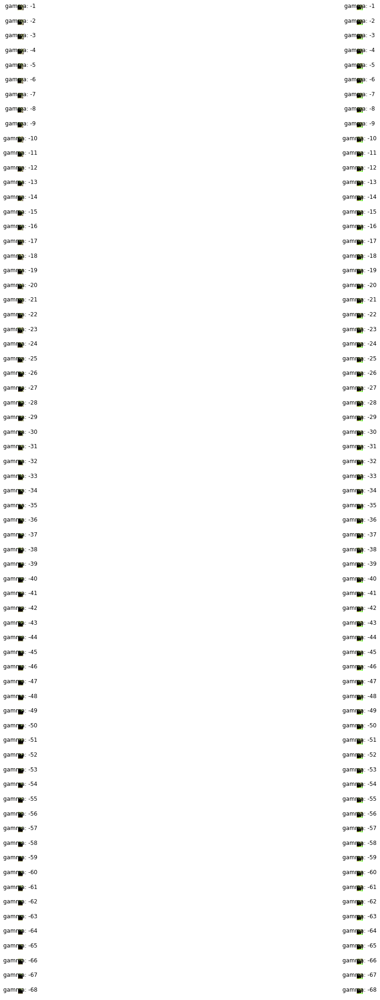

In [77]:
# Testing: Adding small shifts to the image, checking corresponding decisions

# Original prediction
alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
preds = inet_model.predict(np.array([alter_image]))
print("Original Prediction:")
for x in decode_predictions(preds)[0]:
    print(x)
print()

cols, rows = 2, 68
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(30, 30))
i = 0

print("Testing Horizontal Shifts ...\n")
# With negative gammas
gamma = -1
prediction = "American_black_bear"
while prediction == "American_black_bear":
    print("gamma = " + str(gamma))
    alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
    alter_image[:, :gamma] = alter_image[:, -gamma:]
    alter_image = alter_image[:, -gamma:]
    preds = inet_model.predict(np.array([alter_image]))
    tup = decode_predictions(preds)[0][0]
    prediction = tup[1]
    for x in decode_predictions(preds)[0]:
        print(x)
    print()
    
    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex_5 = lime_image.LimeImageExplainer()
    expl_5 = ex_5.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl_5.top_labels))
    temp, mask = expl_5.get_image_and_mask(expl_5.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    gamma -= 1

plt.tight_layout()
plt.show()

Contributing features in original:


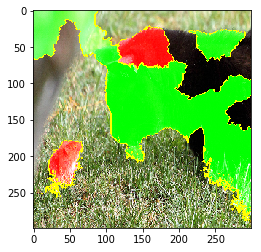

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")

Original Prediction:
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)

Testing Horizontal Shifts ...

gamma = 1
('n02133161', 'American_black_bear', 0.5307827)
('n02105056', 'groenendael', 0.10213137)
('n01877812', 'wallaby', 0.04446058)
('n02104365', 'schipperke', 0.042117905)
('n02119789', 'kit_fox', 0.015399361)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.545698e-17
  overwrite_a=False)



[295, 224, 104, 223, 278]
gamma = 2
('n02133161', 'American_black_bear', 0.5307827)
('n02105056', 'groenendael', 0.10213137)
('n01877812', 'wallaby', 0.04446058)
('n02104365', 'schipperke', 0.042117905)
('n02119789', 'kit_fox', 0.015399361)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



[295, 224, 104, 223, 278]
gamma = 3
('n02133161', 'American_black_bear', 0.5307827)
('n02105056', 'groenendael', 0.10213137)
('n01877812', 'wallaby', 0.04446058)
('n02104365', 'schipperke', 0.042117905)
('n02119789', 'kit_fox', 0.015399361)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.319023e-18
  overwrite_a=False)



[295, 224, 104, 223, 278]
gamma = 4
('n02133161', 'American_black_bear', 0.5307827)
('n02105056', 'groenendael', 0.10213137)
('n01877812', 'wallaby', 0.04446058)
('n02104365', 'schipperke', 0.042117905)
('n02119789', 'kit_fox', 0.015399361)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.332746e-17
  overwrite_a=False)



[295, 224, 104, 223, 278]
gamma = 5
('n02133161', 'American_black_bear', 0.5307827)
('n02105056', 'groenendael', 0.10213137)
('n01877812', 'wallaby', 0.04446058)
('n02104365', 'schipperke', 0.042117905)
('n02119789', 'kit_fox', 0.015399361)


[295, 224, 104, 223, 278]
gamma = 6
('n02133161', 'American_black_bear', 0.5307827)
('n02105056', 'groenendael', 0.10213137)
('n01877812', 'wallaby', 0.04446058)
('n02104365', 'schipperke', 0.042117905)
('n02119789', 'kit_fox', 0.015399361)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.303798e-17
  overwrite_a=False)



[295, 224, 104, 223, 278]
gamma = 7
('n02133161', 'American_black_bear', 0.54550385)
('n02105056', 'groenendael', 0.10090725)
('n01877812', 'wallaby', 0.045010764)
('n02104365', 'schipperke', 0.040875737)
('n02119789', 'kit_fox', 0.014804756)


[295, 224, 104, 223, 278]
gamma = 8
('n02133161', 'American_black_bear', 0.54550385)
('n02105056', 'groenendael', 0.10090725)
('n01877812', 'wallaby', 0.045010764)
('n02104365', 'schipperke', 0.040875737)
('n02119789', 'kit_fox', 0.014804756)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.997092e-17
  overwrite_a=False)



[295, 224, 104, 223, 278]
gamma = 9
('n02133161', 'American_black_bear', 0.480561)
('n02105056', 'groenendael', 0.09347408)
('n01877812', 'wallaby', 0.05137624)
('n02104365', 'schipperke', 0.042797413)
('n02119789', 'kit_fox', 0.018480398)


[295, 224, 104, 223, 278]
gamma = 10
('n02133161', 'American_black_bear', 0.480561)
('n02105056', 'groenendael', 0.09347408)
('n01877812', 'wallaby', 0.05137624)
('n02104365', 'schipperke', 0.042797413)
('n02119789', 'kit_fox', 0.018480398)


[295, 224, 104, 223, 278]
gamma = 11
('n02133161', 'American_black_bear', 0.480561)
('n02105056', 'groenendael', 0.09347408)
('n01877812', 'wallaby', 0.05137624)
('n02104365', 'schipperke', 0.042797413)
('n02119789', 'kit_fox', 0.018480398)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.550994e-18
  overwrite_a=False)



[295, 224, 104, 223, 278]
gamma = 12
('n02133161', 'American_black_bear', 0.480561)
('n02105056', 'groenendael', 0.09347408)
('n01877812', 'wallaby', 0.05137624)
('n02104365', 'schipperke', 0.042797413)
('n02119789', 'kit_fox', 0.018480398)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.973653e-17
  overwrite_a=False)



[295, 224, 104, 223, 278]
gamma = 13
('n02133161', 'American_black_bear', 0.480561)
('n02105056', 'groenendael', 0.09347408)
('n01877812', 'wallaby', 0.05137624)
('n02104365', 'schipperke', 0.042797413)
('n02119789', 'kit_fox', 0.018480398)


[295, 224, 104, 223, 278]
gamma = 14
('n02133161', 'American_black_bear', 0.480561)
('n02105056', 'groenendael', 0.09347408)
('n01877812', 'wallaby', 0.05137624)
('n02104365', 'schipperke', 0.042797413)
('n02119789', 'kit_fox', 0.018480398)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.024155e-17
  overwrite_a=False)



[295, 224, 104, 223, 278]
gamma = 15
('n02133161', 'American_black_bear', 0.5663257)
('n02105056', 'groenendael', 0.07164911)
('n01877812', 'wallaby', 0.044356283)
('n02104365', 'schipperke', 0.03448294)
('n02119789', 'kit_fox', 0.0156167755)


[295, 224, 104, 223, 278]
gamma = 16
('n02133161', 'American_black_bear', 0.5663257)
('n02105056', 'groenendael', 0.07164911)
('n01877812', 'wallaby', 0.044356283)
('n02104365', 'schipperke', 0.03448294)
('n02119789', 'kit_fox', 0.0156167755)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.508286e-17
  overwrite_a=False)



[295, 224, 104, 223, 278]
gamma = 17
('n02133161', 'American_black_bear', 0.7398011)
('n02105056', 'groenendael', 0.04132917)
('n02104365', 'schipperke', 0.026492145)
('n01883070', 'wombat', 0.019345198)
('n01877812', 'wallaby', 0.017972153)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.896269e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 18
('n02133161', 'American_black_bear', 0.7398011)
('n02105056', 'groenendael', 0.04132917)
('n02104365', 'schipperke', 0.026492145)
('n01883070', 'wombat', 0.019345198)
('n01877812', 'wallaby', 0.017972153)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.959961e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 19
('n02133161', 'American_black_bear', 0.7398011)
('n02105056', 'groenendael', 0.04132917)
('n02104365', 'schipperke', 0.026492145)
('n01883070', 'wombat', 0.019345198)
('n01877812', 'wallaby', 0.017972153)


[295, 224, 223, 106, 104]
gamma = 20
('n02133161', 'American_black_bear', 0.7398011)
('n02105056', 'groenendael', 0.04132917)
('n02104365', 'schipperke', 0.026492145)
('n01883070', 'wombat', 0.019345198)
('n01877812', 'wallaby', 0.017972153)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.434738e-18
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 21
('n02133161', 'American_black_bear', 0.7398011)
('n02105056', 'groenendael', 0.04132917)
('n02104365', 'schipperke', 0.026492145)
('n01883070', 'wombat', 0.019345198)
('n01877812', 'wallaby', 0.017972153)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.231797e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 22
('n02133161', 'American_black_bear', 0.7398011)
('n02105056', 'groenendael', 0.04132917)
('n02104365', 'schipperke', 0.026492145)
('n01883070', 'wombat', 0.019345198)
('n01877812', 'wallaby', 0.017972153)


[295, 224, 223, 106, 104]
gamma = 23
('n02133161', 'American_black_bear', 0.73530203)
('n02105056', 'groenendael', 0.04284565)
('n02104365', 'schipperke', 0.02512567)
('n01877812', 'wallaby', 0.01933324)
('n01883070', 'wombat', 0.018883849)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.967932e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 24
('n02133161', 'American_black_bear', 0.73530203)
('n02105056', 'groenendael', 0.04284565)
('n02104365', 'schipperke', 0.02512567)
('n01877812', 'wallaby', 0.01933324)
('n01883070', 'wombat', 0.018883849)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.760321e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 25
('n02133161', 'American_black_bear', 0.6860463)
('n02105056', 'groenendael', 0.043013398)
('n02104365', 'schipperke', 0.034830272)
('n01877812', 'wallaby', 0.021518987)
('n01883070', 'wombat', 0.01739058)


[295, 224, 223, 104, 106]
gamma = 26
('n02133161', 'American_black_bear', 0.6860463)
('n02105056', 'groenendael', 0.043013398)
('n02104365', 'schipperke', 0.034830272)
('n01877812', 'wallaby', 0.021518987)
('n01883070', 'wombat', 0.01739058)


[295, 224, 223, 104, 106]
gamma = 27
('n02133161', 'American_black_bear', 0.6860463)
('n02105056', 'groenendael', 0.043013398)
('n02104365', 'schipperke', 0.034830272)
('n01877812', 'wallaby', 0.021518987)
('n01883070', 'wombat', 0.01739058)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.474331e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 28
('n02133161', 'American_black_bear', 0.6860463)
('n02105056', 'groenendael', 0.043013398)
('n02104365', 'schipperke', 0.034830272)
('n01877812', 'wallaby', 0.021518987)
('n01883070', 'wombat', 0.01739058)


[295, 224, 223, 104, 106]
gamma = 29
('n02133161', 'American_black_bear', 0.6860463)
('n02105056', 'groenendael', 0.043013398)
('n02104365', 'schipperke', 0.034830272)
('n01877812', 'wallaby', 0.021518987)
('n01883070', 'wombat', 0.01739058)


[295, 224, 223, 104, 106]
gamma = 30
('n02133161', 'American_black_bear', 0.6860463)
('n02105056', 'groenendael', 0.043013398)
('n02104365', 'schipperke', 0.034830272)
('n01877812', 'wallaby', 0.021518987)
('n01883070', 'wombat', 0.01739058)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.371925e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 31
('n02133161', 'American_black_bear', 0.70028865)
('n02105056', 'groenendael', 0.047209203)
('n02104365', 'schipperke', 0.03584457)
('n01883070', 'wombat', 0.023442272)
('n01877812', 'wallaby', 0.021503614)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.542906e-17
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 32
('n02133161', 'American_black_bear', 0.70028865)
('n02105056', 'groenendael', 0.047209203)
('n02104365', 'schipperke', 0.03584457)
('n01883070', 'wombat', 0.023442272)
('n01877812', 'wallaby', 0.021503614)


[295, 224, 223, 106, 104]
gamma = 33
('n02133161', 'American_black_bear', 0.48609453)
('n02105056', 'groenendael', 0.1403403)
('n02104365', 'schipperke', 0.05849696)
('n01877812', 'wallaby', 0.05163252)
('n02119789', 'kit_fox', 0.024761682)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.763715e-18
  overwrite_a=False)



[295, 224, 223, 104, 278]
gamma = 34
('n02133161', 'American_black_bear', 0.48609453)
('n02105056', 'groenendael', 0.1403403)
('n02104365', 'schipperke', 0.05849696)
('n01877812', 'wallaby', 0.05163252)
('n02119789', 'kit_fox', 0.024761682)


[295, 224, 223, 104, 278]
gamma = 35
('n02133161', 'American_black_bear', 0.48609418)
('n02105056', 'groenendael', 0.1403404)
('n02104365', 'schipperke', 0.05849717)
('n01877812', 'wallaby', 0.051632408)
('n02119789', 'kit_fox', 0.024761656)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.558884e-17
  overwrite_a=False)



[295, 224, 223, 104, 278]
gamma = 36
('n02133161', 'American_black_bear', 0.48609418)
('n02105056', 'groenendael', 0.1403404)
('n02104365', 'schipperke', 0.05849717)
('n01877812', 'wallaby', 0.051632408)
('n02119789', 'kit_fox', 0.024761656)


[295, 224, 223, 104, 278]
gamma = 37
('n02133161', 'American_black_bear', 0.48609453)
('n02105056', 'groenendael', 0.1403403)
('n02104365', 'schipperke', 0.05849696)
('n01877812', 'wallaby', 0.05163252)
('n02119789', 'kit_fox', 0.024761682)


[295, 224, 223, 104, 278]
gamma = 38
('n02133161', 'American_black_bear', 0.48609453)
('n02105056', 'groenendael', 0.1403403)
('n02104365', 'schipperke', 0.05849696)
('n01877812', 'wallaby', 0.05163252)
('n02119789', 'kit_fox', 0.024761682)


[295, 224, 223, 104, 278]
gamma = 39
('n02133161', 'American_black_bear', 0.5115023)
('n02105056', 'groenendael', 0.14089775)
('n02104365', 'schipperke', 0.052882105)
('n01877812', 'wallaby', 0.04941978)
('n02112137', 'chow', 0.022871727)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.199185e-17
  overwrite_a=False)



[295, 224, 223, 104, 260]
gamma = 40
('n02133161', 'American_black_bear', 0.5115023)
('n02105056', 'groenendael', 0.14089775)
('n02104365', 'schipperke', 0.052882105)
('n01877812', 'wallaby', 0.04941978)
('n02112137', 'chow', 0.022871727)


[295, 224, 223, 104, 260]
gamma = 41
('n02133161', 'American_black_bear', 0.47437727)
('n02105056', 'groenendael', 0.11345422)
('n02104365', 'schipperke', 0.06263249)
('n01877812', 'wallaby', 0.04563432)
('n02112137', 'chow', 0.0302656)


[295, 224, 223, 104, 260]
gamma = 42
('n02133161', 'American_black_bear', 0.47437727)
('n02105056', 'groenendael', 0.11345422)
('n02104365', 'schipperke', 0.06263249)
('n01877812', 'wallaby', 0.04563432)
('n02112137', 'chow', 0.0302656)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.527510e-17
  overwrite_a=False)



[295, 224, 223, 104, 260]
gamma = 43
('n02133161', 'American_black_bear', 0.47437727)
('n02105056', 'groenendael', 0.11345422)
('n02104365', 'schipperke', 0.06263249)
('n01877812', 'wallaby', 0.04563432)
('n02112137', 'chow', 0.0302656)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.881348e-17
  overwrite_a=False)



[295, 224, 223, 104, 260]
gamma = 44
('n02133161', 'American_black_bear', 0.47437727)
('n02105056', 'groenendael', 0.11345422)
('n02104365', 'schipperke', 0.06263249)
('n01877812', 'wallaby', 0.04563432)
('n02112137', 'chow', 0.0302656)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number5.606318e-18
  overwrite_a=False)



[295, 224, 223, 104, 260]
gamma = 45
('n02133161', 'American_black_bear', 0.47437727)
('n02105056', 'groenendael', 0.11345422)
('n02104365', 'schipperke', 0.06263249)
('n01877812', 'wallaby', 0.04563432)
('n02112137', 'chow', 0.0302656)


[295, 224, 223, 104, 260]
gamma = 46
('n02133161', 'American_black_bear', 0.47437727)
('n02105056', 'groenendael', 0.11345422)
('n02104365', 'schipperke', 0.06263249)
('n01877812', 'wallaby', 0.04563432)
('n02112137', 'chow', 0.0302656)


[295, 224, 223, 104, 260]
gamma = 47
('n02133161', 'American_black_bear', 0.5648118)
('n02105056', 'groenendael', 0.11341806)
('n02104365', 'schipperke', 0.044792604)
('n01877812', 'wallaby', 0.038023982)
('n02112137', 'chow', 0.022983262)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.294267e-17
  overwrite_a=False)



[295, 224, 223, 104, 260]
gamma = 48
('n02133161', 'American_black_bear', 0.5648118)
('n02105056', 'groenendael', 0.11341806)
('n02104365', 'schipperke', 0.044792604)
('n01877812', 'wallaby', 0.038023982)
('n02112137', 'chow', 0.022983262)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number5.085876e-17
  overwrite_a=False)



[295, 224, 223, 104, 260]
gamma = 49
('n02133161', 'American_black_bear', 0.8623157)
('n02105056', 'groenendael', 0.032309756)
('n02104365', 'schipperke', 0.026962275)
('n01877812', 'wallaby', 0.009656751)
('n01883070', 'wombat', 0.008282317)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.157239e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 50
('n02133161', 'American_black_bear', 0.8623157)
('n02105056', 'groenendael', 0.032309756)
('n02104365', 'schipperke', 0.026962275)
('n01877812', 'wallaby', 0.009656751)
('n01883070', 'wombat', 0.008282317)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.105661e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 51
('n02133161', 'American_black_bear', 0.8623157)
('n02105056', 'groenendael', 0.032309756)
('n02104365', 'schipperke', 0.026962275)
('n01877812', 'wallaby', 0.009656751)
('n01883070', 'wombat', 0.008282317)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.237504e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 52
('n02133161', 'American_black_bear', 0.8623157)
('n02105056', 'groenendael', 0.032309756)
('n02104365', 'schipperke', 0.026962275)
('n01877812', 'wallaby', 0.009656751)
('n01883070', 'wombat', 0.008282317)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.259971e-17
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 53
('n02133161', 'American_black_bear', 0.8623157)
('n02105056', 'groenendael', 0.032309756)
('n02104365', 'schipperke', 0.026962275)
('n01877812', 'wallaby', 0.009656751)
('n01883070', 'wombat', 0.008282317)


[295, 224, 223, 104, 106]
gamma = 54
('n02133161', 'American_black_bear', 0.8623157)
('n02105056', 'groenendael', 0.032309756)
('n02104365', 'schipperke', 0.026962275)
('n01877812', 'wallaby', 0.009656751)
('n01883070', 'wombat', 0.008282317)


[295, 224, 223, 104, 106]
gamma = 55
('n02133161', 'American_black_bear', 0.8569)
('n02105056', 'groenendael', 0.03547339)
('n02104365', 'schipperke', 0.02556883)
('n01877812', 'wallaby', 0.010016704)
('n01883070', 'wombat', 0.009243238)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number5.738298e-18
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 56
('n02133161', 'American_black_bear', 0.8569)
('n02105056', 'groenendael', 0.03547339)
('n02104365', 'schipperke', 0.02556883)
('n01877812', 'wallaby', 0.010016704)
('n01883070', 'wombat', 0.009243238)


[295, 224, 223, 104, 106]
gamma = 57
('n02133161', 'American_black_bear', 0.8344071)
('n02105056', 'groenendael', 0.048407163)
('n02104365', 'schipperke', 0.033992283)
('n01877812', 'wallaby', 0.008179642)
('n01883070', 'wombat', 0.007067865)


[295, 224, 223, 104, 106]
gamma = 58
('n02133161', 'American_black_bear', 0.8344071)
('n02105056', 'groenendael', 0.048407163)
('n02104365', 'schipperke', 0.033992283)
('n01877812', 'wallaby', 0.008179642)
('n01883070', 'wombat', 0.007067865)


[295, 224, 223, 104, 106]
gamma = 59
('n02133161', 'American_black_bear', 0.8344071)
('n02105056', 'groenendael', 0.048407163)
('n02104365', 'schipperke', 0.033992283)
('n01877812', 'wallaby', 0.008179642)
('n01883070', 'wombat', 0.007067865)


[295, 224, 223, 104, 106

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number6.999360e-18
  overwrite_a=False)



[295, 224, 223, 104, 106]
gamma = 61
('n02133161', 'American_black_bear', 0.8344071)
('n02105056', 'groenendael', 0.048407163)
('n02104365', 'schipperke', 0.033992283)
('n01877812', 'wallaby', 0.008179642)
('n01883070', 'wombat', 0.007067865)


[295, 224, 223, 104, 106]
gamma = 62
('n02133161', 'American_black_bear', 0.8344071)
('n02105056', 'groenendael', 0.048407163)
('n02104365', 'schipperke', 0.033992283)
('n01877812', 'wallaby', 0.008179642)
('n01883070', 'wombat', 0.007067865)


[295, 224, 223, 104, 106]
gamma = 63
('n02133161', 'American_black_bear', 0.86096233)
('n02105056', 'groenendael', 0.037935052)
('n02104365', 'schipperke', 0.031036984)
('n01883070', 'wombat', 0.012930461)
('n01877812', 'wallaby', 0.0052569816)


[295, 224, 223, 106, 104]
gamma = 64
('n02133161', 'American_black_bear', 0.86096233)
('n02105056', 'groenendael', 0.037935052)
('n02104365', 'schipperke', 0.031036984)
('n01883070', 'wombat', 0.012930461)
('n01877812', 'wallaby', 0.0052569816)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number5.381641e-18
  overwrite_a=False)



[295, 224, 223, 106, 104]
gamma = 65
('n02133161', 'American_black_bear', 0.340698)
('n02104365', 'schipperke', 0.12539588)
('n01877812', 'wallaby', 0.12462257)
('n02105056', 'groenendael', 0.11615197)
('n02119789', 'kit_fox', 0.037292086)


[295, 223, 104, 224, 278]
gamma = 66
('n02133161', 'American_black_bear', 0.340698)
('n02104365', 'schipperke', 0.12539588)
('n01877812', 'wallaby', 0.12462257)
('n02105056', 'groenendael', 0.11615197)
('n02119789', 'kit_fox', 0.037292086)


[295, 223, 104, 224, 278]
gamma = 67
('n02133161', 'American_black_bear', 0.340698)
('n02104365', 'schipperke', 0.12539588)
('n01877812', 'wallaby', 0.12462257)
('n02105056', 'groenendael', 0.11615197)
('n02119789', 'kit_fox', 0.037292086)


[295, 223, 104, 224, 278]
gamma = 68
('n02133161', 'American_black_bear', 0.340698)
('n02104365', 'schipperke', 0.12539588)
('n01877812', 'wallaby', 0.12462257)
('n02105056', 'groenendael', 0.11615197)
('n02119789', 'kit_fox', 0.037292086)


[295, 223, 104, 224, 278]
gamma

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.205249e-17
  overwrite_a=False)



[295, 104, 223, 224, 278]
gamma = 72
('n02133161', 'American_black_bear', 0.3225989)
('n01877812', 'wallaby', 0.1389337)
('n02104365', 'schipperke', 0.119849004)
('n02105056', 'groenendael', 0.11386474)
('n02119789', 'kit_fox', 0.03784399)


[295, 104, 223, 224, 278]
gamma = 73
('n02133161', 'American_black_bear', 0.36432245)
('n02105056', 'groenendael', 0.124282114)
('n02104365', 'schipperke', 0.10632364)
('n01877812', 'wallaby', 0.10461377)
('n02119789', 'kit_fox', 0.04016824)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number5.855069e-17
  overwrite_a=False)



[295, 224, 223, 104, 278]
gamma = 74
('n02133161', 'American_black_bear', 0.36432245)
('n02105056', 'groenendael', 0.124282114)
('n02104365', 'schipperke', 0.10632364)
('n01877812', 'wallaby', 0.10461377)
('n02119789', 'kit_fox', 0.04016824)


[295, 224, 223, 104, 278]
gamma = 75
('n02133161', 'American_black_bear', 0.36432245)
('n02105056', 'groenendael', 0.124282114)
('n02104365', 'schipperke', 0.10632364)
('n01877812', 'wallaby', 0.10461377)
('n02119789', 'kit_fox', 0.04016824)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.578156e-17
  overwrite_a=False)



[295, 224, 223, 104, 278]
gamma = 76
('n02133161', 'American_black_bear', 0.36432245)
('n02105056', 'groenendael', 0.124282114)
('n02104365', 'schipperke', 0.10632364)
('n01877812', 'wallaby', 0.10461377)
('n02119789', 'kit_fox', 0.04016824)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.137726e-17
  overwrite_a=False)



[295, 224, 223, 104, 278]
gamma = 77
('n02133161', 'American_black_bear', 0.36432245)
('n02105056', 'groenendael', 0.124282114)
('n02104365', 'schipperke', 0.10632364)
('n01877812', 'wallaby', 0.10461377)
('n02119789', 'kit_fox', 0.04016824)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.260892e-17
  overwrite_a=False)



[295, 224, 223, 104, 278]
gamma = 78
('n02133161', 'American_black_bear', 0.36432245)
('n02105056', 'groenendael', 0.124282114)
('n02104365', 'schipperke', 0.10632364)
('n01877812', 'wallaby', 0.10461377)
('n02119789', 'kit_fox', 0.04016824)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.572248e-17
  overwrite_a=False)



[295, 224, 223, 104, 278]
gamma = 79
('n02133161', 'American_black_bear', 0.41894057)
('n01877812', 'wallaby', 0.125469)
('n02105056', 'groenendael', 0.08790759)
('n02104365', 'schipperke', 0.08021806)
('n02119789', 'kit_fox', 0.031299777)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number6.201052e-18
  overwrite_a=False)



[295, 104, 224, 223, 278]
gamma = 80
('n02133161', 'American_black_bear', 0.41894057)
('n01877812', 'wallaby', 0.125469)
('n02105056', 'groenendael', 0.08790759)
('n02104365', 'schipperke', 0.08021806)
('n02119789', 'kit_fox', 0.031299777)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.182508e-17
  overwrite_a=False)



[295, 104, 224, 223, 278]
gamma = 81
('n02133161', 'American_black_bear', 0.7644462)
('n02105056', 'groenendael', 0.05841647)
('n02104365', 'schipperke', 0.039923094)
('n02127052', 'lynx', 0.021608427)
('n01877812', 'wallaby', 0.017458908)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.319299e-18
  overwrite_a=False)



[295, 224, 223, 287, 104]
gamma = 82
('n02133161', 'American_black_bear', 0.7644462)
('n02105056', 'groenendael', 0.05841647)
('n02104365', 'schipperke', 0.039923094)
('n02127052', 'lynx', 0.021608427)
('n01877812', 'wallaby', 0.017458908)


[295, 224, 223, 287, 104]
gamma = 83
('n02133161', 'American_black_bear', 0.7644462)
('n02105056', 'groenendael', 0.05841647)
('n02104365', 'schipperke', 0.039923094)
('n02127052', 'lynx', 0.021608427)
('n01877812', 'wallaby', 0.017458908)


[295, 224, 223, 287, 104]
gamma = 84
('n02133161', 'American_black_bear', 0.7644462)
('n02105056', 'groenendael', 0.05841647)
('n02104365', 'schipperke', 0.039923094)
('n02127052', 'lynx', 0.021608427)
('n01877812', 'wallaby', 0.017458908)


[295, 224, 223, 287, 104]
gamma = 85
('n02133161', 'American_black_bear', 0.7644462)
('n02105056', 'groenendael', 0.05841647)
('n02104365', 'schipperke', 0.039923094)
('n02127052', 'lynx', 0.021608427)
('n01877812', 'wallaby', 0.017458908)


[295, 224, 223, 287, 104]
gamma

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number4.054439e-17
  overwrite_a=False)



[295, 224, 223, 104, 287]
gamma = 88
('n02133161', 'American_black_bear', 0.7751161)
('n02105056', 'groenendael', 0.052611623)
('n02104365', 'schipperke', 0.036867693)
('n01877812', 'wallaby', 0.025530979)
('n02127052', 'lynx', 0.020553973)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.216680e-17
  overwrite_a=False)



[295, 224, 223, 104, 287]
gamma = 89
('n02133161', 'American_black_bear', 0.803816)
('n02104365', 'schipperke', 0.049729977)
('n02105056', 'groenendael', 0.035686012)
('n02127052', 'lynx', 0.015253274)
('n01877812', 'wallaby', 0.00809048)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number8.156399e-18
  overwrite_a=False)



[295, 223, 224, 287, 104]
gamma = 90
('n02133161', 'American_black_bear', 0.803816)
('n02104365', 'schipperke', 0.049729977)
('n02105056', 'groenendael', 0.035686012)
('n02127052', 'lynx', 0.015253274)
('n01877812', 'wallaby', 0.00809048)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.356460e-17
  overwrite_a=False)



[295, 223, 224, 287, 104]
gamma = 91
('n02133161', 'American_black_bear', 0.803816)
('n02104365', 'schipperke', 0.049729977)
('n02105056', 'groenendael', 0.035686012)
('n02127052', 'lynx', 0.015253274)
('n01877812', 'wallaby', 0.00809048)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.991863e-17
  overwrite_a=False)



[295, 223, 224, 287, 104]
gamma = 92
('n02133161', 'American_black_bear', 0.803816)
('n02104365', 'schipperke', 0.049729977)
('n02105056', 'groenendael', 0.035686012)
('n02127052', 'lynx', 0.015253274)
('n01877812', 'wallaby', 0.00809048)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.651310e-17
  overwrite_a=False)



[295, 223, 224, 287, 104]
gamma = 93
('n02133161', 'American_black_bear', 0.803816)
('n02104365', 'schipperke', 0.049729977)
('n02105056', 'groenendael', 0.035686012)
('n02127052', 'lynx', 0.015253274)
('n01877812', 'wallaby', 0.00809048)


[295, 223, 224, 287, 104]
gamma = 94
('n02133161', 'American_black_bear', 0.803816)
('n02104365', 'schipperke', 0.049729977)
('n02105056', 'groenendael', 0.035686012)
('n02127052', 'lynx', 0.015253274)
('n01877812', 'wallaby', 0.00809048)


[295, 223, 224, 287, 104]
gamma = 95
('n02133161', 'American_black_bear', 0.8999824)
('n02104365', 'schipperke', 0.031048845)
('n02105056', 'groenendael', 0.029801887)
('n01883070', 'wombat', 0.007661695)
('n01877812', 'wallaby', 0.003621998)


[295, 223, 224, 106, 104]
gamma = 96
('n02133161', 'American_black_bear', 0.8999824)
('n02104365', 'schipperke', 0.031048845)
('n02105056', 'groenendael', 0.029801887)
('n01883070', 'wombat', 0.007661695)
('n01877812', 'wallaby', 0.003621998)


[295, 223, 224, 106, 104]
g

/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.348544e-17
  overwrite_a=False)



[278, 224, 223, 295, 287]


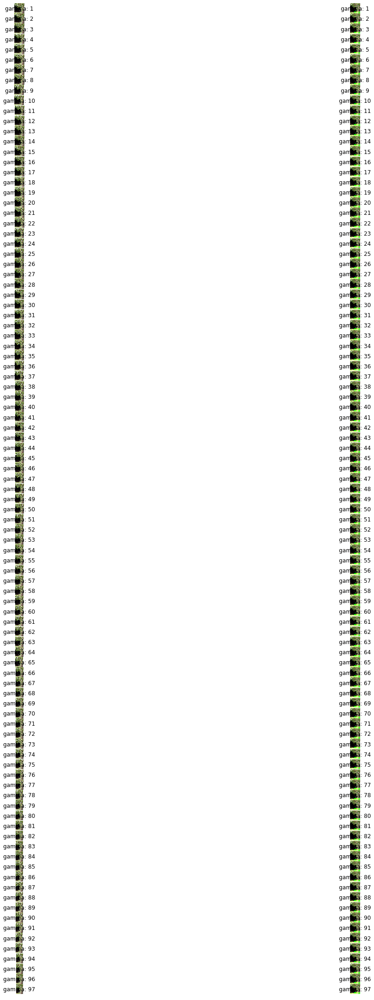

In [78]:
# Original prediction
alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
preds = inet_model.predict(np.array([alter_image]))
print("Original Prediction:")
for x in decode_predictions(preds)[0]:
    print(x)
print()

cols, rows = 2, 97
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(30, 30))
i = 0

print("Testing Horizontal Shifts ...\n")
# With positive gammas
gamma = 1
result = "American_black_bear"
while result == "American_black_bear":
    print("gamma = " + str(gamma))
    alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
    alter_image[:, gamma:] = alter_image[:, :-gamma]
    alter_image = alter_image[:, gamma:]
    preds = inet_model.predict(np.array([alter_image]))
    tup = decode_predictions(preds)[0][0]
    result = tup[1]
    for x in decode_predictions(preds)[0]:
        print(x)
    print()
    
    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex_7 = lime_image.LimeImageExplainer()
    expl_7 = ex_7.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl_7.top_labels))
    temp, mask = expl_7.get_image_and_mask(expl_7.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("gamma: " + str(round(gamma, 2)))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    gamma += 1

plt.tight_layout()
plt.show()

Contributing features in original:


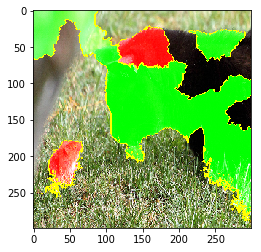

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")

Original Prediction:
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)

Testing 90 Degree Rotations ...

Rotated: 90 degrees counterclockwise
('n02133161', 'American_black_bear', 0.1319117)
('n02480855', 'gorilla', 0.07502159)
('n02492660', 'howler_monkey', 0.06381178)
('n02410509', 'bison', 0.057392772)
('n02437616', 'llama', 0.056557424)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



[295, 366, 379, 347, 355]
Rotated: 180 degrees counterclockwise
('n01872401', 'echidna', 0.22855957)
('n01883070', 'wombat', 0.13900973)
('n01514859', 'hen', 0.08975421)
('n02442845', 'mink', 0.07283429)
('n02346627', 'porcupine', 0.054075543)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.481516e-17
  overwrite_a=False)



[102, 106, 8, 357, 334]


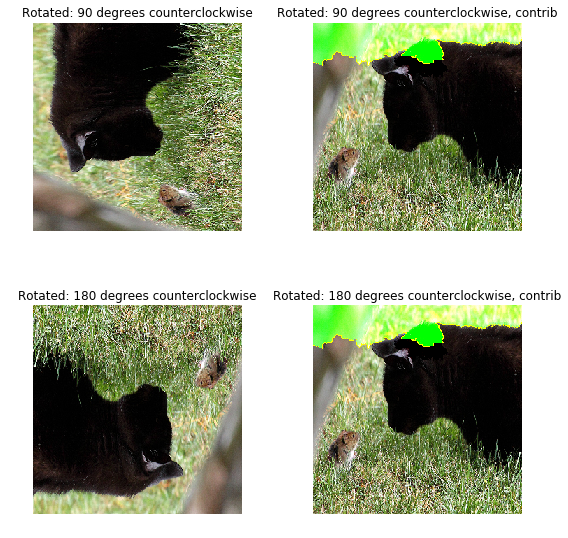

In [84]:
# Testing: Rotations

# Original prediction
alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
preds = inet_model.predict(np.array([alter_image]))
print("Original Prediction:")
for x in decode_predictions(preds)[0]:
    print(x)
print()

cols, rows = 2, 2
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(4 * rows, 4 * cols))
i = 0

print("Testing 90 Degree Rotations ...\n")
for d in range(1, 3):
    print("Rotated: " + str(d * 90) + " degrees counterclockwise")
    alter_image = np.rot90(alter_image)
    preds = inet_model.predict(np.array([alter_image]))
    preds = inet_model.predict(np.array([alter_image]))
    tup = decode_predictions(preds)[0][0]
    for x in decode_predictions(preds)[0]:
        print(x)
    print()
    
    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("Rotated: " + str(d * 90) + " degrees counterclockwise")
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex_8 = lime_image.LimeImageExplainer()
    expl_8 = ex_8.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl_8.top_labels))
    temp, mask = expl_8.get_image_and_mask(expl_8.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("Rotated: " + str(d * 90) + " degrees counterclockwise, contrib")
    axeslist.ravel()[i].set_axis_off()
    i += 1

plt.tight_layout()
plt.show()

Contributing features in original:


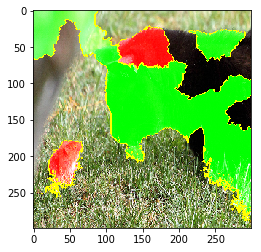

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")

Original Prediction:
('n02133161', 'American_black_bear', 0.63716227)
('n02105056', 'groenendael', 0.031817853)
('n02104365', 'schipperke', 0.029944101)
('n01883070', 'wombat', 0.028509347)
('n01877812', 'wallaby', 0.02509332)

Testing 90 Degree Rotations ...

Rotated: 90 degrees counterclockwise
('n02133161', 'American_black_bear', 0.1319117)
('n02480855', 'gorilla', 0.07502159)
('n02492660', 'howler_monkey', 0.06381178)
('n02410509', 'bison', 0.057392772)
('n02437616', 'llama', 0.056557424)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:152: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.851686e-17
  overwrite_a=False)



[295, 366, 379, 347, 355]
Rotated: 180 degrees counterclockwise
('n01872401', 'echidna', 0.22855957)
('n01883070', 'wombat', 0.13900973)
('n01514859', 'hen', 0.08975421)
('n02442845', 'mink', 0.07283429)
('n02346627', 'porcupine', 0.054075543)



/data/rliaw/miniconda3/envs/tf3/lib/python3.5/site-packages/sklearn/linear_model/ridge.py:154: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "



[102, 106, 8, 357, 334]
Rotated: 270 degrees counterclockwise
('n02104365', 'schipperke', 0.80063075)
('n02133161', 'American_black_bear', 0.054653365)
('n02105056', 'groenendael', 0.043697134)
('n02480855', 'gorilla', 0.0032963653)
('n02442845', 'mink', 0.0024145108)


[223, 295, 224, 366, 357]


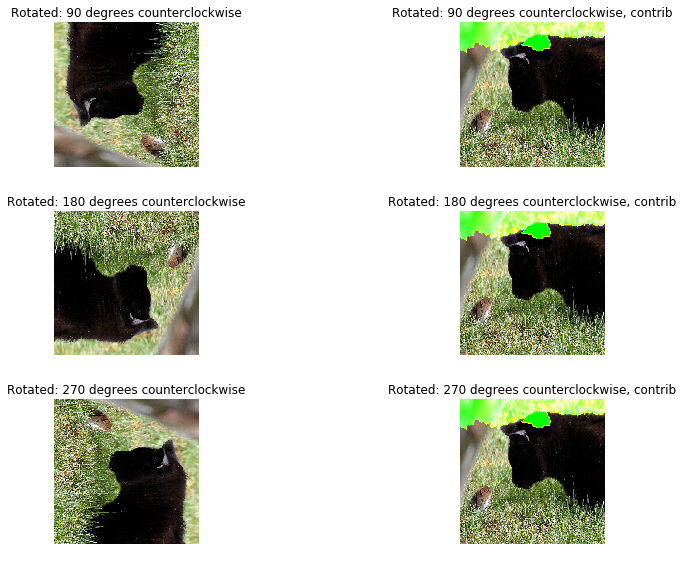

In [83]:
# Testing: Rotations

# Original prediction
alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
preds = inet_model.predict(np.array([alter_image]))
print("Original Prediction:")
for x in decode_predictions(preds)[0]:
    print(x)
print()

cols, rows = 2, 3
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(4 * rows, 4 * cols))
i = 0

print("Testing 90 Degree Rotations ...\n")
for d in range(1, 4):
    print("Rotated: " + str(d * 90) + " degrees counterclockwise")
    alter_image = np.rot90(alter_image)
    preds = inet_model.predict(np.array([alter_image]))
    preds = inet_model.predict(np.array([alter_image]))
    tup = decode_predictions(preds)[0][0]
    for x in decode_predictions(preds)[0]:
        print(x)
    print()
    
    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("Rotated: " + str(d * 90) + " degrees counterclockwise")
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex_9 = lime_image.LimeImageExplainer()
    expl_9 = ex_9.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl_9.top_labels))
    temp, mask = expl_9.get_image_and_mask(expl_9.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("Rotated: " + str(d * 90) + " degrees counterclockwise, contrib")
    axeslist.ravel()[i].set_axis_off()
    i += 1

plt.tight_layout()
plt.show()

Contributing features in original:


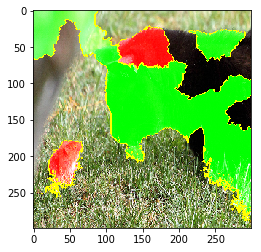

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")

In [ ]:
# Testing: Zoom

# Original prediction
alter_image = transform_img_fn([os.path.join('data','cat_mouse.jpg')])[0]
preds = inet_model.predict(np.array([alter_image]))
print("Original Prediction:")
for x in decode_predictions(preds)[0]:
    print(x)
print()

cols, rows = 2, 35
fig, axeslist = plt.subplots(ncols=cols, nrows=rows, figsize=(4 * rows, 4 * cols))
i = 0

print("Testing Zoom In ...\n")
# zoom should be < (299/2)
zoom, result = 1, "American_black_bear"
while zoom < 299 / 2 and result == "American_black_bear":
    print("\nzoom = " + str(zoom))
    zoomed = alter_image[zoom:-zoom, zoom:-zoom]
    preds = inet_model.predict(np.array([zoomed]))
    preds = inet_model.predict(np.array([zoomed]))
    tup = decode_predictions(preds)[0][0]
    result = tup[1]
    for x in decode_predictions(preds)[0]:
        print(x)
    print()
    
    alt = alter_image.copy()
    alt[np.where(alt > 1)] = 1
    alt[np.where(alt < -1)] = -1

    axeslist.ravel()[i].imshow(alt / 2 + .5, cmap=plt.gray())
    axeslist.ravel()[i].set_title("zoom: " + str(zoom))
    axeslist.ravel()[i].set_axis_off()
    i += 1
    
    ex_10 = lime_image.LimeImageExplainer()
    expl_10 = ex_10.explain_instance(alt, inet_model.predict, top_labels=5, hide_color=0, num_samples=10)
    print("\n" + str(expl_10.top_labels))
    temp, mask = expl_10.get_image_and_mask(expl_10.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    
    axeslist.ravel()[i].imshow(alt_marked, cmap=plt.gray())
    axeslist.ravel()[i].set_title("zoom: " + str(zoom) + ", contrib")
    axeslist.ravel()[i].set_axis_off()
    i += 1
                                  
    zoom += 1

plt.tight_layout()
plt.show()

Contributing features in original:


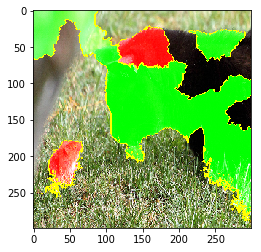

In [130]:
temp, mask = explanation.get_image_and_mask(295, positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
print("Contributing features in original:")